In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

import warnings

In [3]:
pd.set_option('max_columns', 100)
pd.set_option("display.precision", 4)

rcParams['figure.figsize'] = (16, 8)
plt.style.use('fivethirtyeight')
sns.set(font_scale=2.5)

warnings.filterwarnings('ignore')

# 대회 데이터 시각화

In [4]:
train = pd.read_csv('../input/dankook/train.csv', index_col=0)
train_sample = train.sample(n=10000, random_state=2020)

In [5]:
train.describe()

,u,g,r,i,z,redshift,dered_u,dered_g,dered_r,dered_i,dered_z,nObserve,nDetect,airmass_u,airmass_g,airmass_r,airmass_i,airmass_z,class
count,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,3.2000e+05,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000,320000.0000
mean,19.8524,18.3768,17.7358,17.1742,16.8752,5.8308e-02,19.6289,18.2271,17.6154,17.1523,16.8693,6.3327,6.1388,1.1758,1.1765,1.1751,1.1754,1.1761,1.1163
std,1.9455,31.1108,1.4662,52.5615,57.1463,5.7546e-01,1.9236,17.7866,1.4730,25.0758,35.4365,8.8811,8.5516,0.1163,0.1181,0.1147,0.1155,0.1172,0.9235
min,-17.6875,-17555.3656,7.7314,-23955.8178,-23955.8178,-1.6605e+02,-42.8375,-9999.0000,-16.3802,-9999.0000,-9999.0000,1.0000,1.0000,1.0001,1.0000,1.0002,1.0001,1.0000,0.0000
25%,18.7242,17.4749,16.8772,16.5239,16.2889,3.5580e-05,18.5636,17.3484,16.7871,16.4530,16.2341,1.0000,1.0000,1.0882,1.0884,1.0878,1.0880,1.0883,0.0000
50%,19.4194,18.1405,17.5258,17.1497,16.9176,4.7129e-02,19.2646,18.0224,17.4434,17.0874,16.8694,2.0000,2.0000,1.1793,1.1792,1.1794,1.1794,1.1793,1.0000
75%,20.4321,19.0732,18.4281,18.0074,17.7289,9.4597e-02,20.1976,18.8884,18.2911,17.9070,17.6557,5.0000,5.0000,1.2275,1.2260,1.2292,1.2286,1.2268,2.0000
max,58.6233,46.3383,72.0097,50.1641,52.6127,6.2323e+01,30.7779,30.6132,31.9572,32.0162,30.7813,44.0000,42.0000,2.0508,2.0803,2.0221,2.0363,2.0654,2.0000


## u, g, r, i, z 에 대해서 시각화

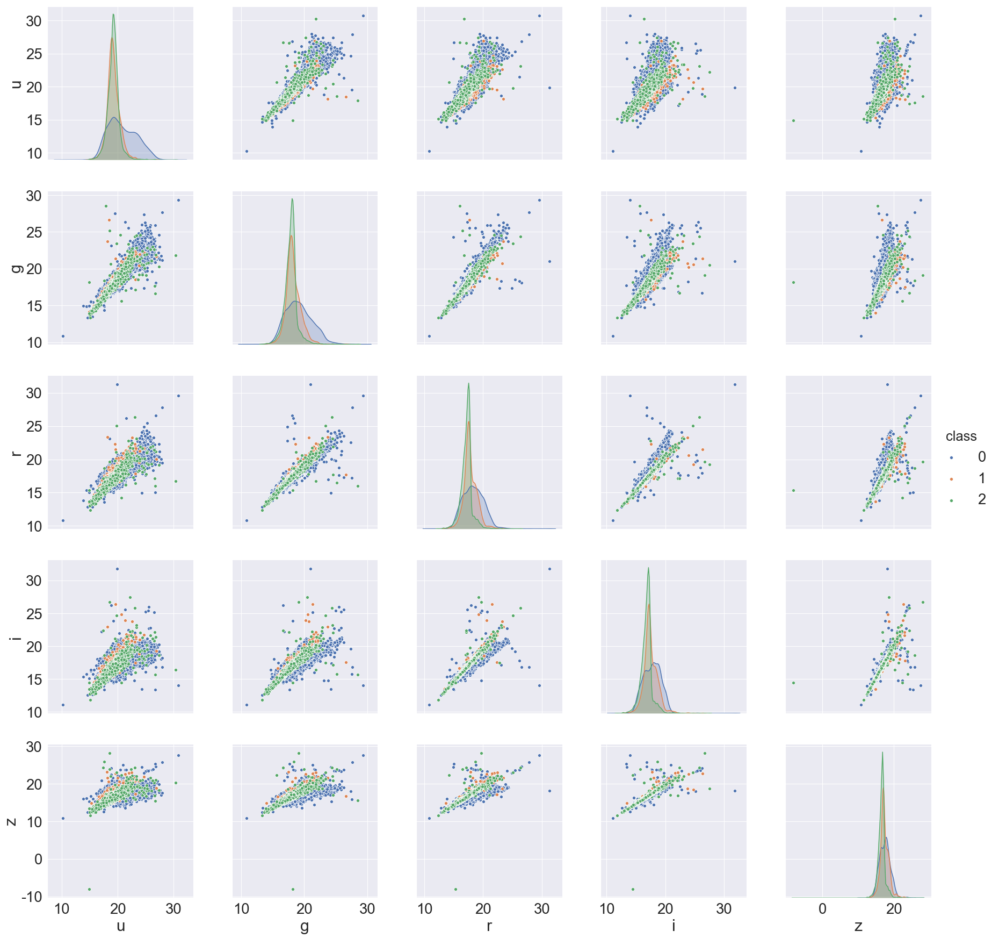

In [6]:
sns.pairplot(data=train_sample, vars=['u','g','r','i','z'], size=5, hue='class')

## dered_X 에 대해서 시각화

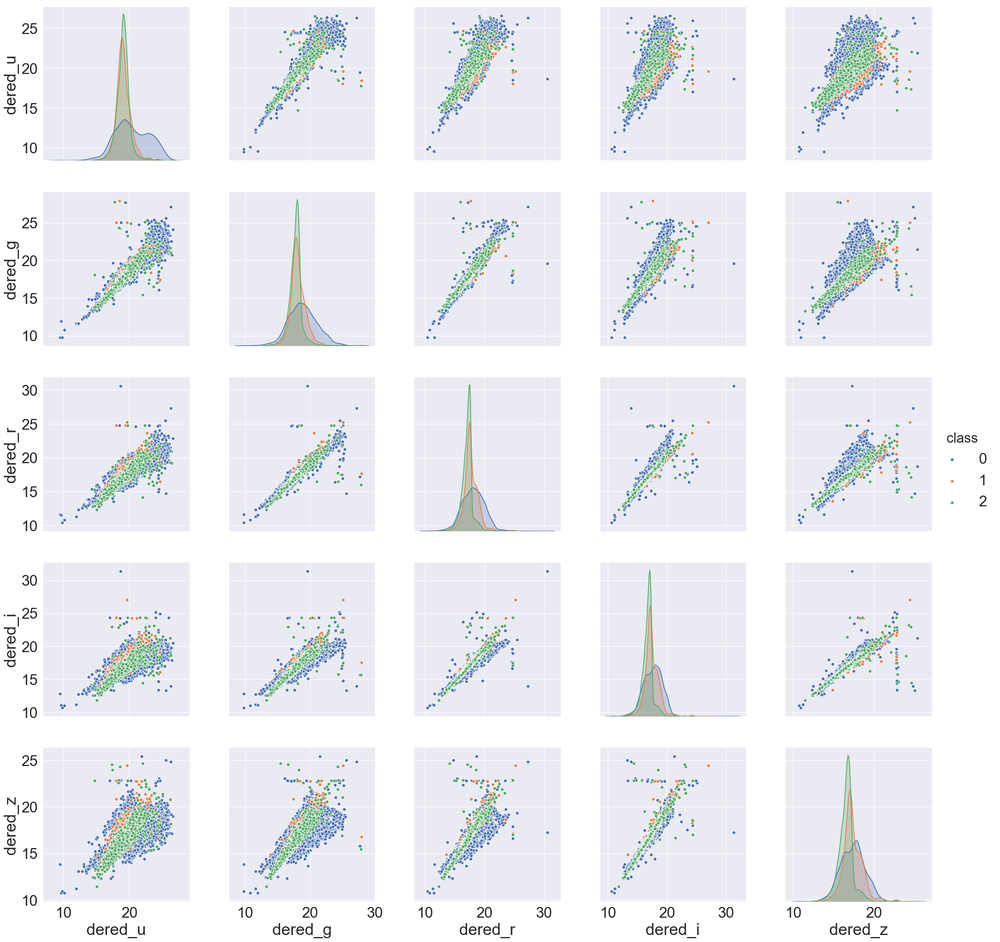

In [7]:
sns.pairplot(data=train_sample, vars=['dered_u', 'dered_g','dered_r','dered_i','dered_z'], size=5, hue='class')

## airmass_X 에 대해서 시각화

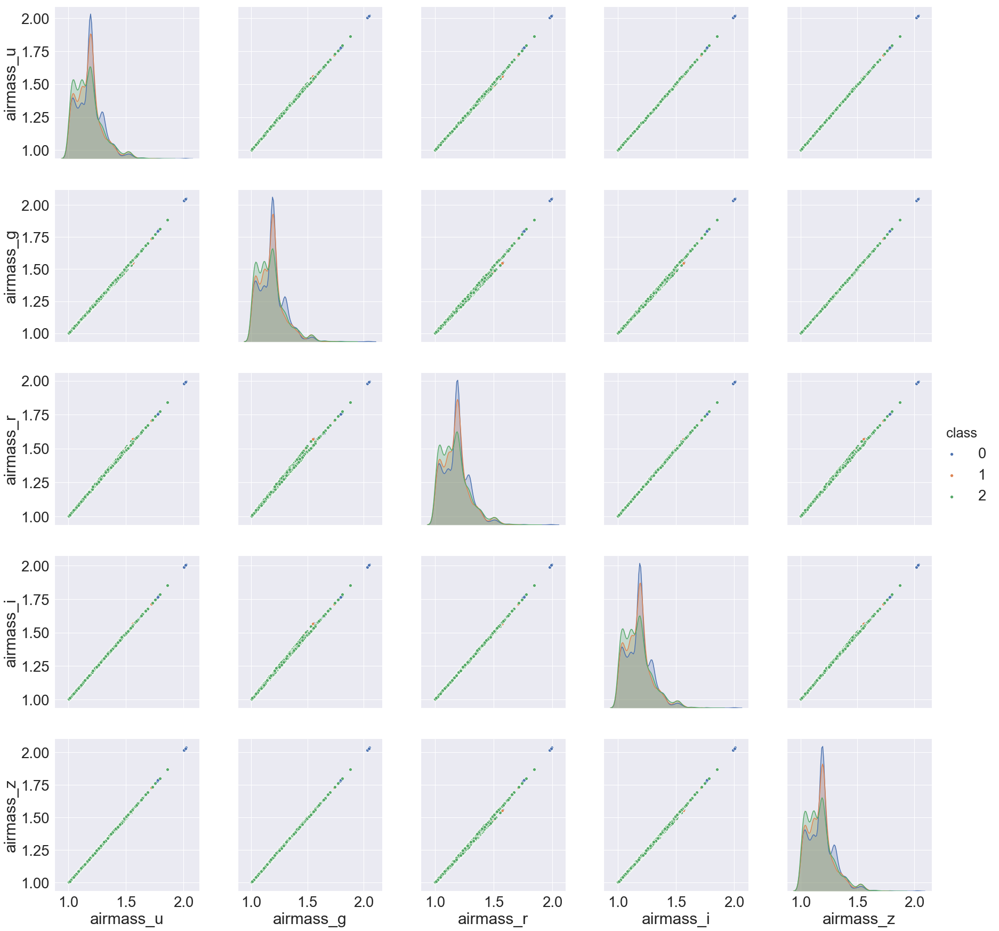

In [8]:
sns.pairplot(data=train_sample, vars=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'], hue='class', size=5)

## X, dered_X, airmass_X 에 대해서 시각화

### u

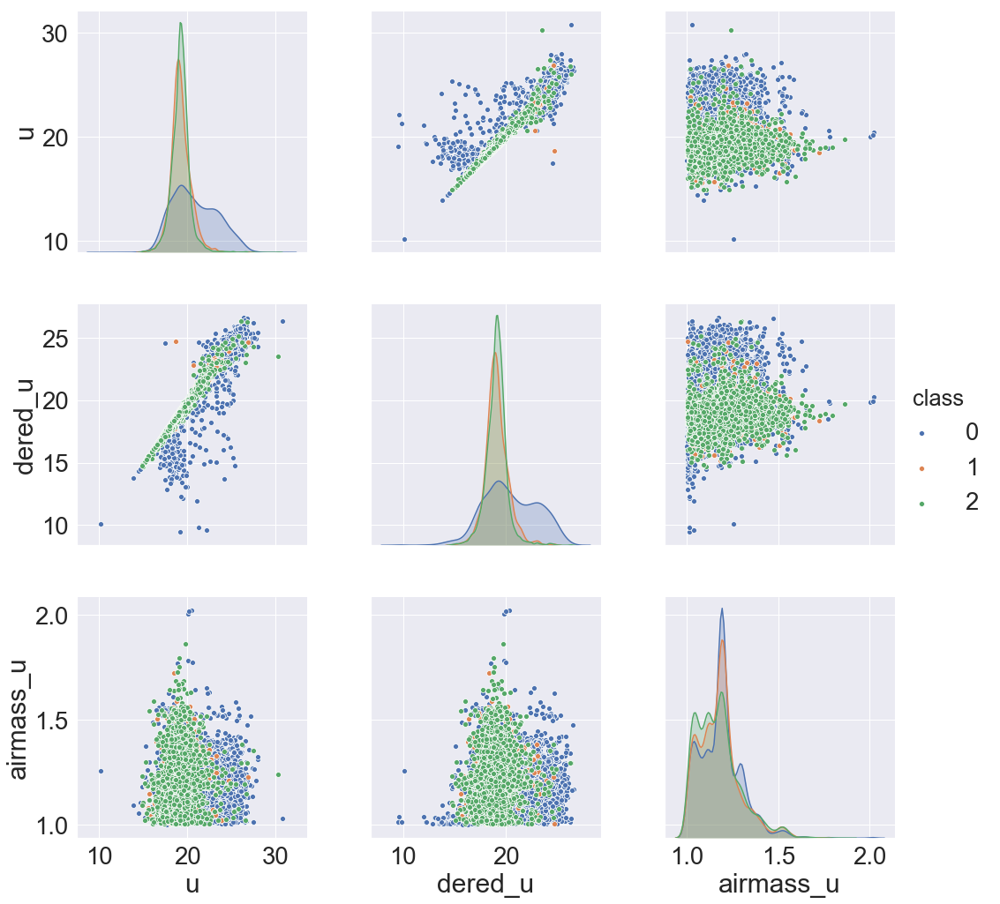

In [9]:
sns.pairplot(data=train_sample, vars=['u','dered_u','airmass_u'], hue='class', size=5)

### r

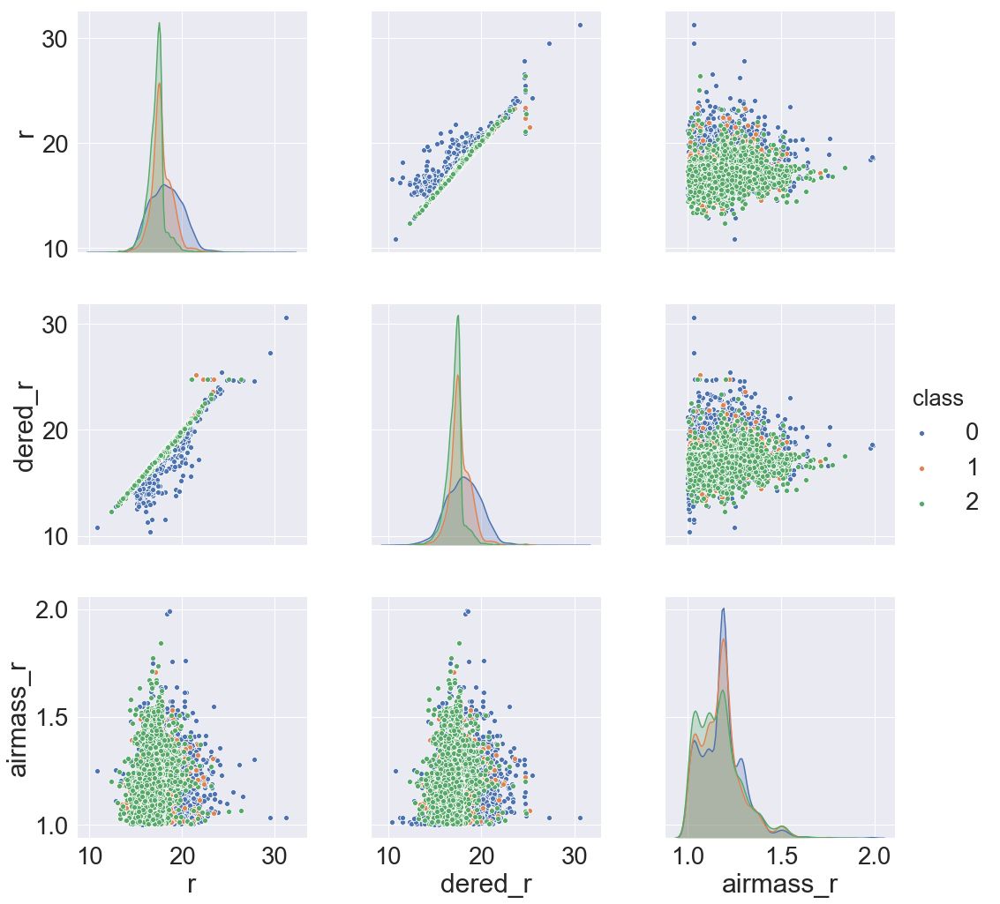

In [10]:
sns.pairplot(data=train_sample, vars=['r','dered_r','airmass_r'], hue='class', size=5)

### g

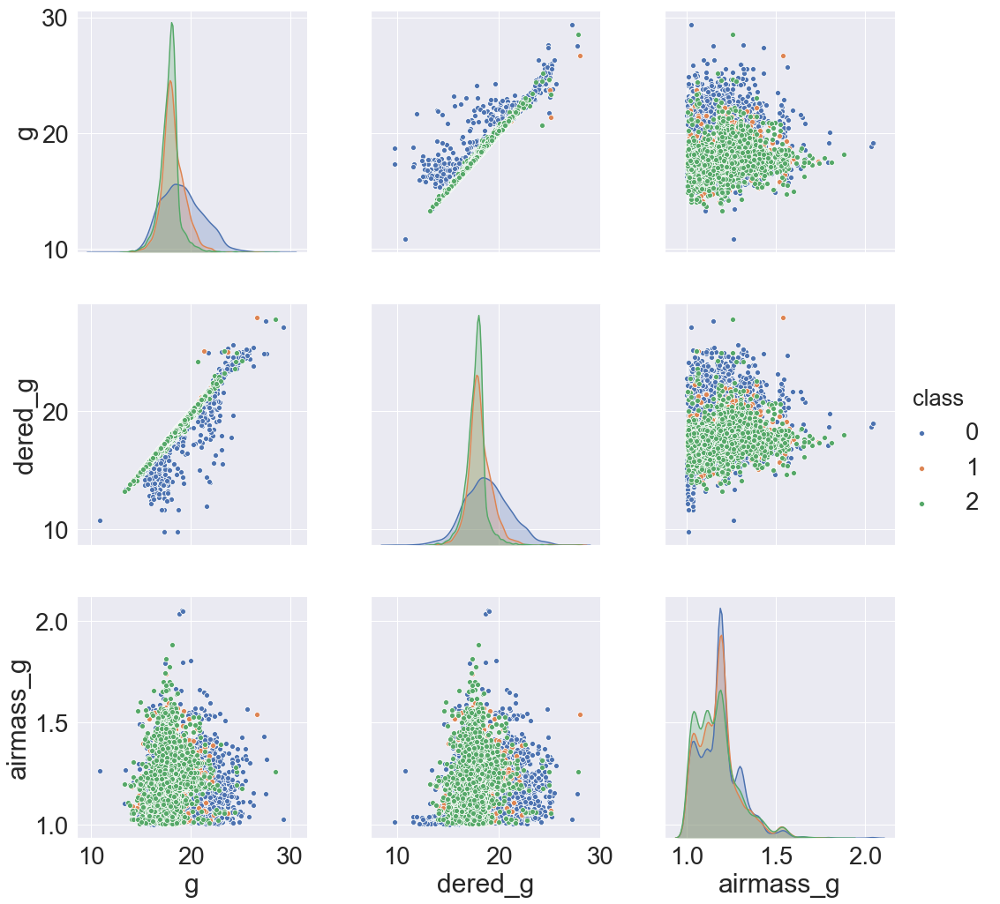

In [11]:
sns.pairplot(data=train_sample, vars=['g','dered_g','airmass_g'], hue='class', size=5)

### i

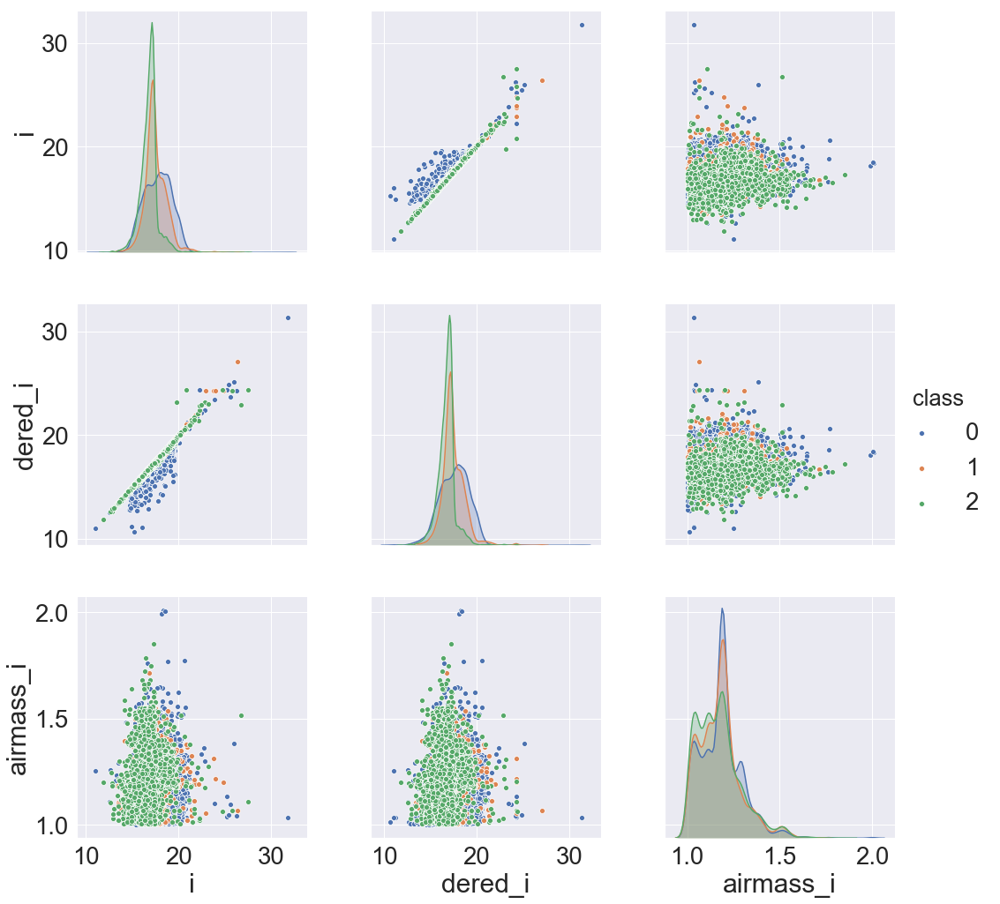

In [12]:
sns.pairplot(data=train_sample, vars=['i','dered_i','airmass_i'], hue='class', size=5)

### z

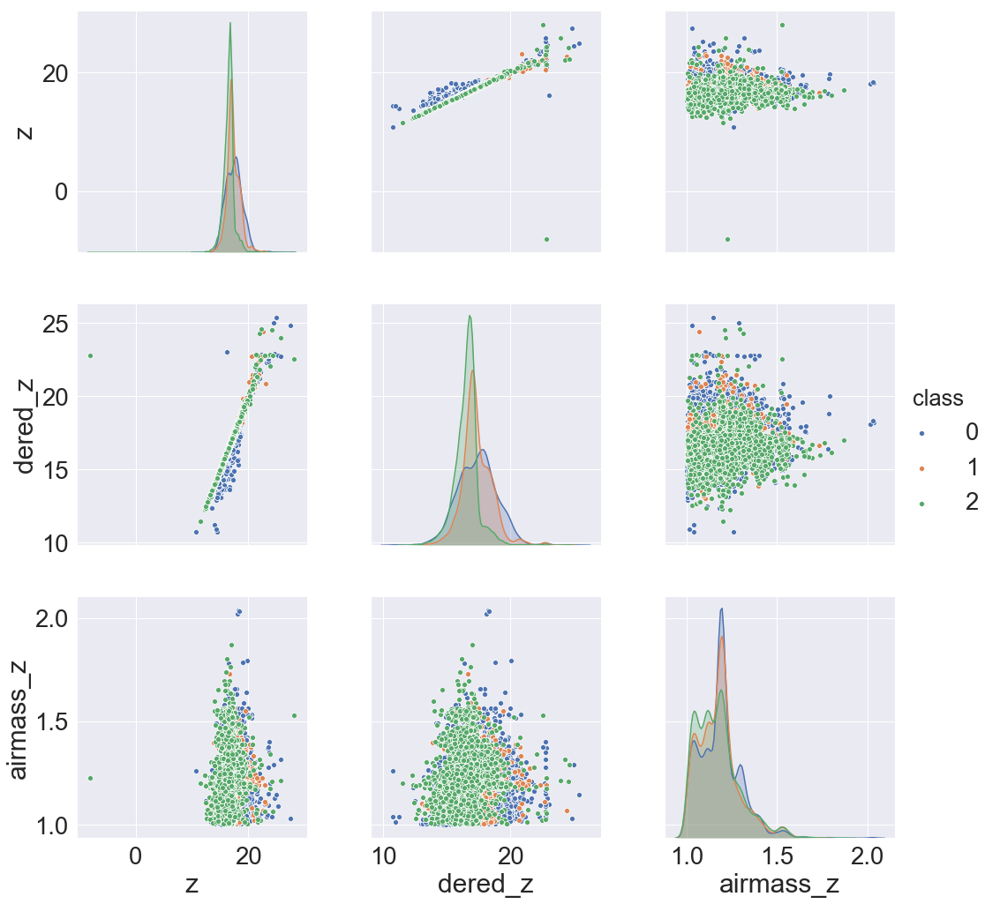

In [13]:
sns.pairplot(data=train_sample, vars=['z','dered_z','airmass_z'], hue='class', size=5)

## redshift, nObserve, nDetect 에 대해서 시각화

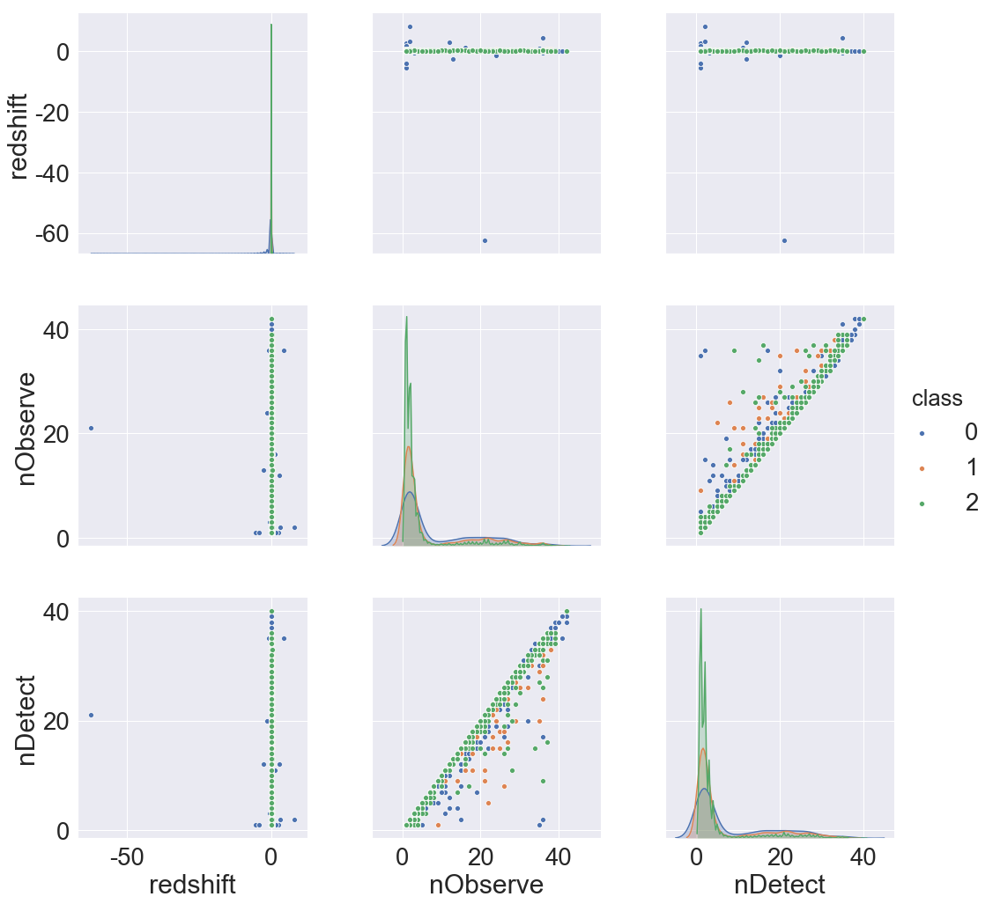

In [14]:
sns.pairplot(data=train_sample, vars=['redshift','nObserve','nDetect'], hue='class', size=5)

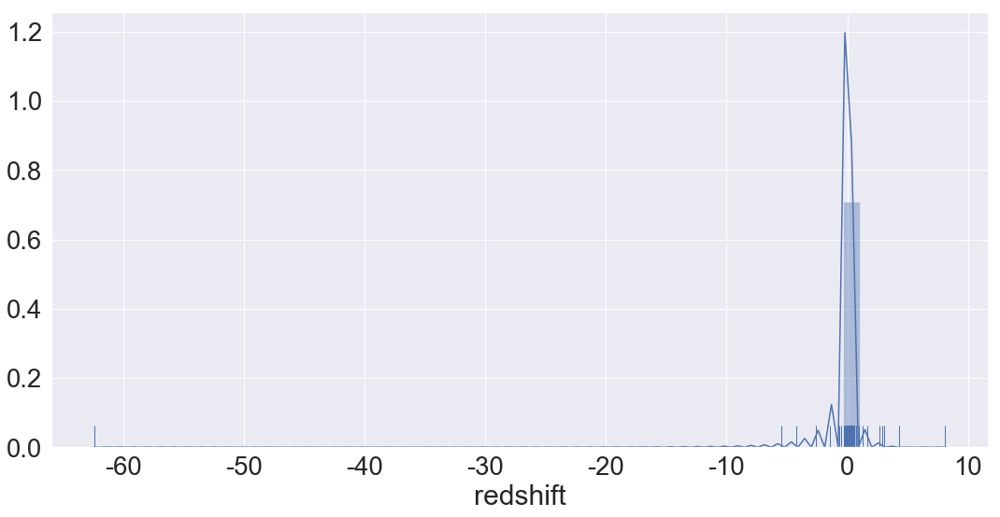

In [15]:
sns.distplot(train_sample['redshift'], kde=True, rug=True)

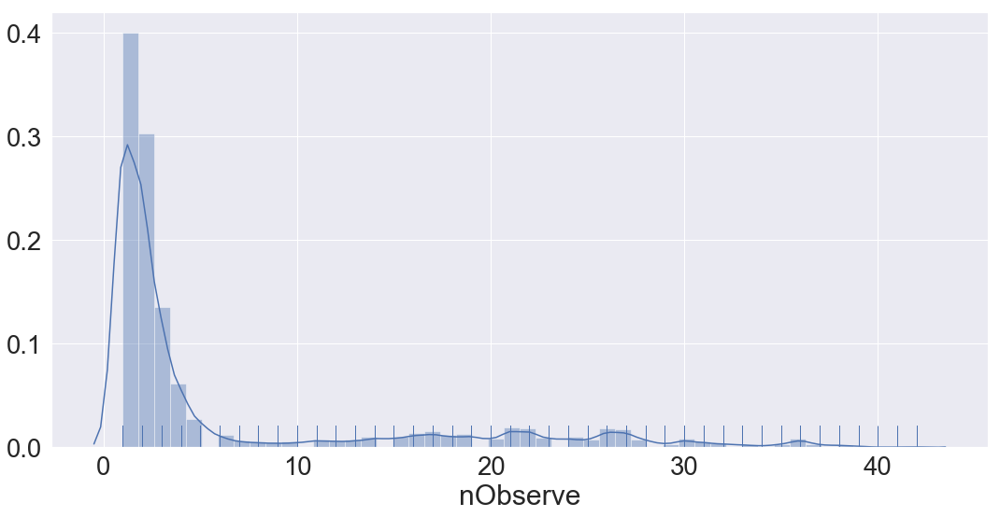

In [16]:
sns.distplot(train_sample['nObserve'], kde=True, rug=True)

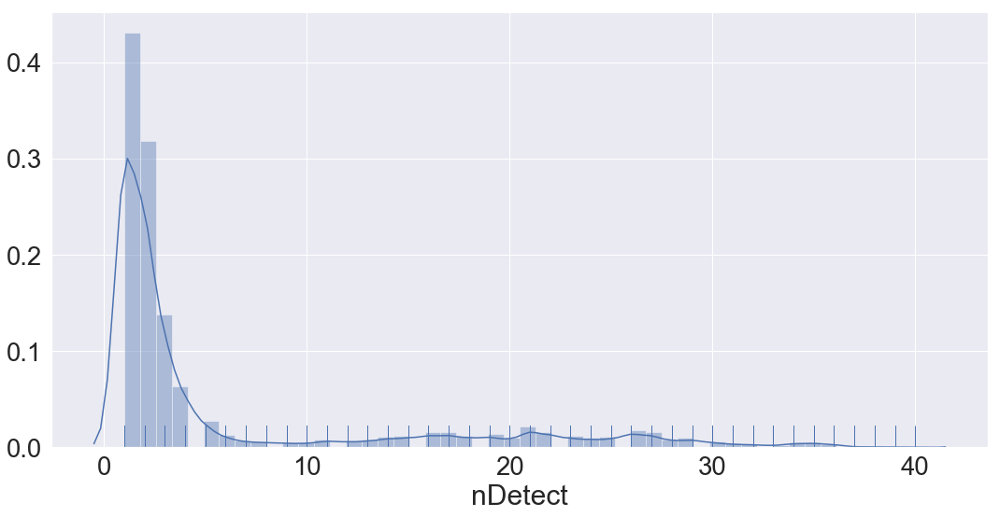

In [17]:
sns.distplot(train_sample['nDetect'], kde=True, rug=True)

# 대회 데이터 수치형 변수 가공

## 멱함수 분포 변수 log1p 변환

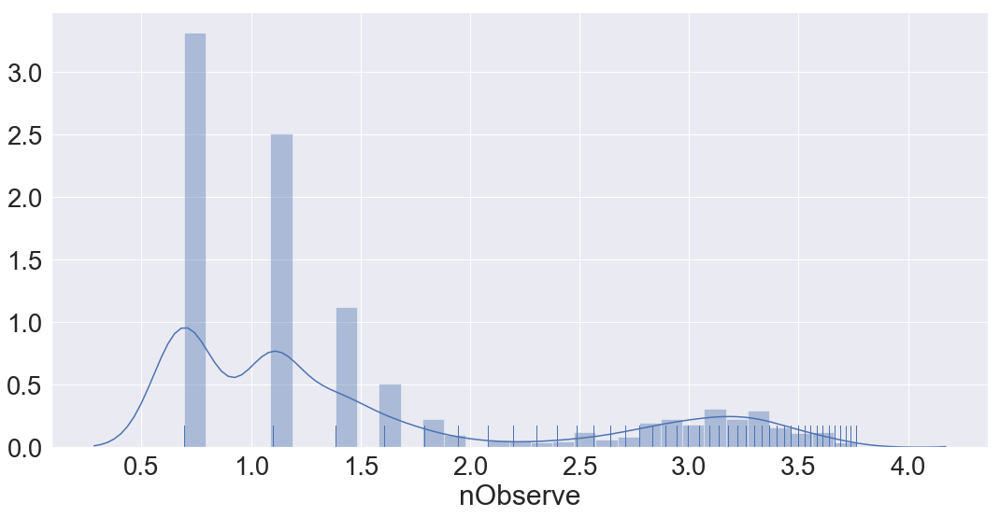

In [18]:
sns.distplot(np.log1p(train_sample['nObserve']), kde=True, rug=True)

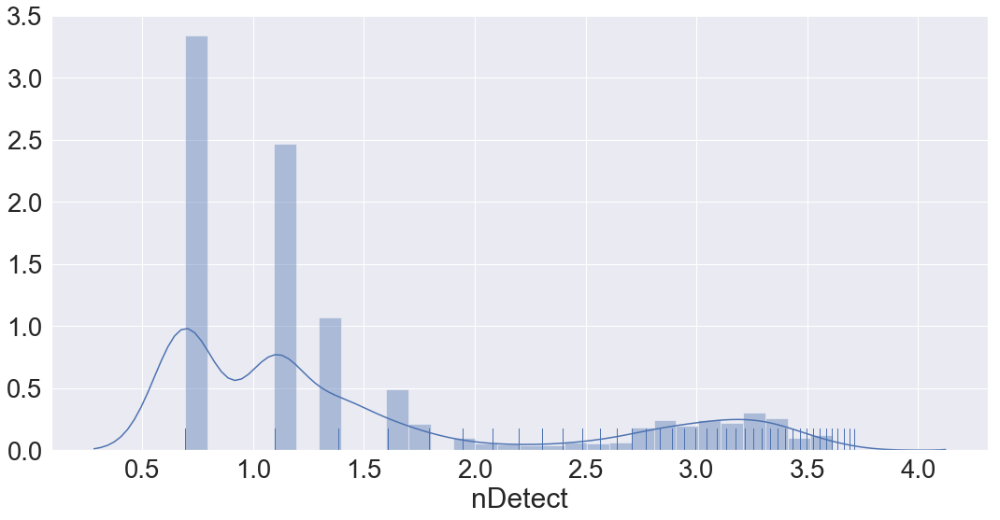

In [19]:
sns.distplot(np.log1p(train_sample['nDetect']), kde=True, rug=True)

## 정규화/스케일링

In [20]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer

### ugriz에 대해서 스케일링

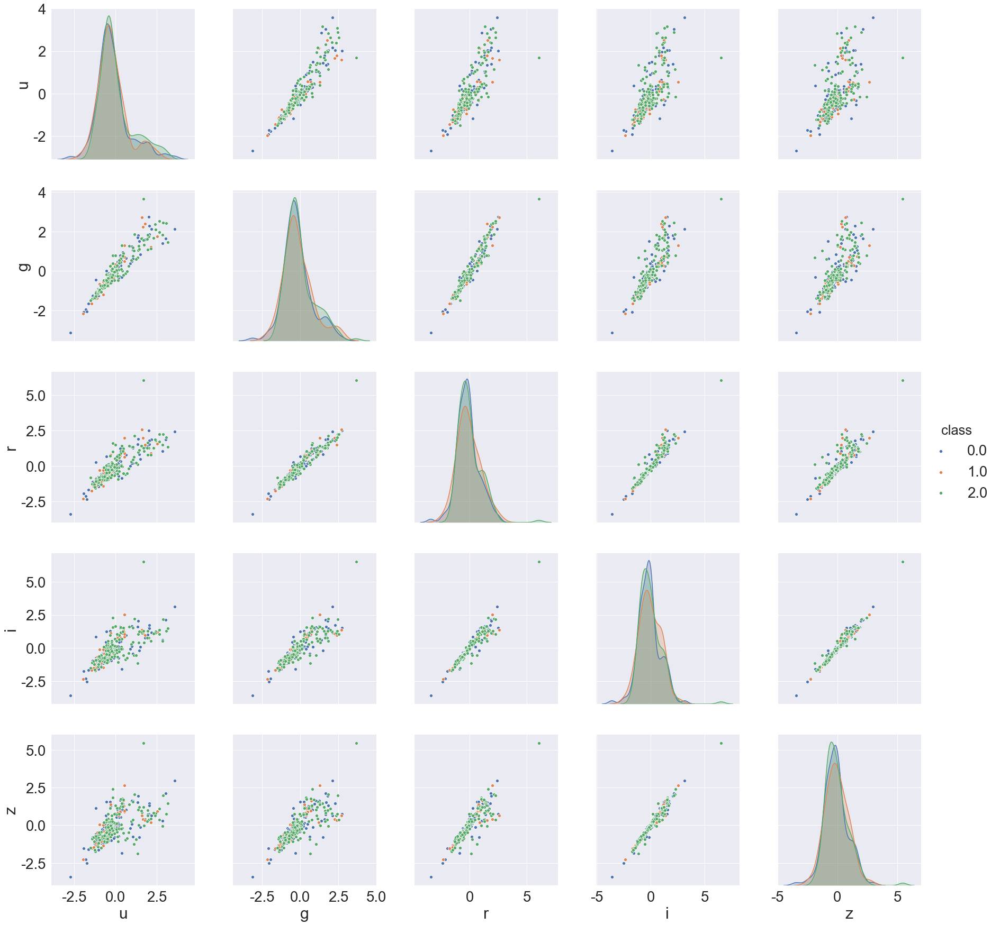

In [23]:
scaler = StandardScaler()
ugriz = scaler.fit_transform(train_sample[['u','g','r','i','z']])
ugriz = pd.DataFrame(ugriz, columns=['u','g','r','i','z'])
ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=ugriz, vars=['u','g','r','i','z'],hue='class', size=5)

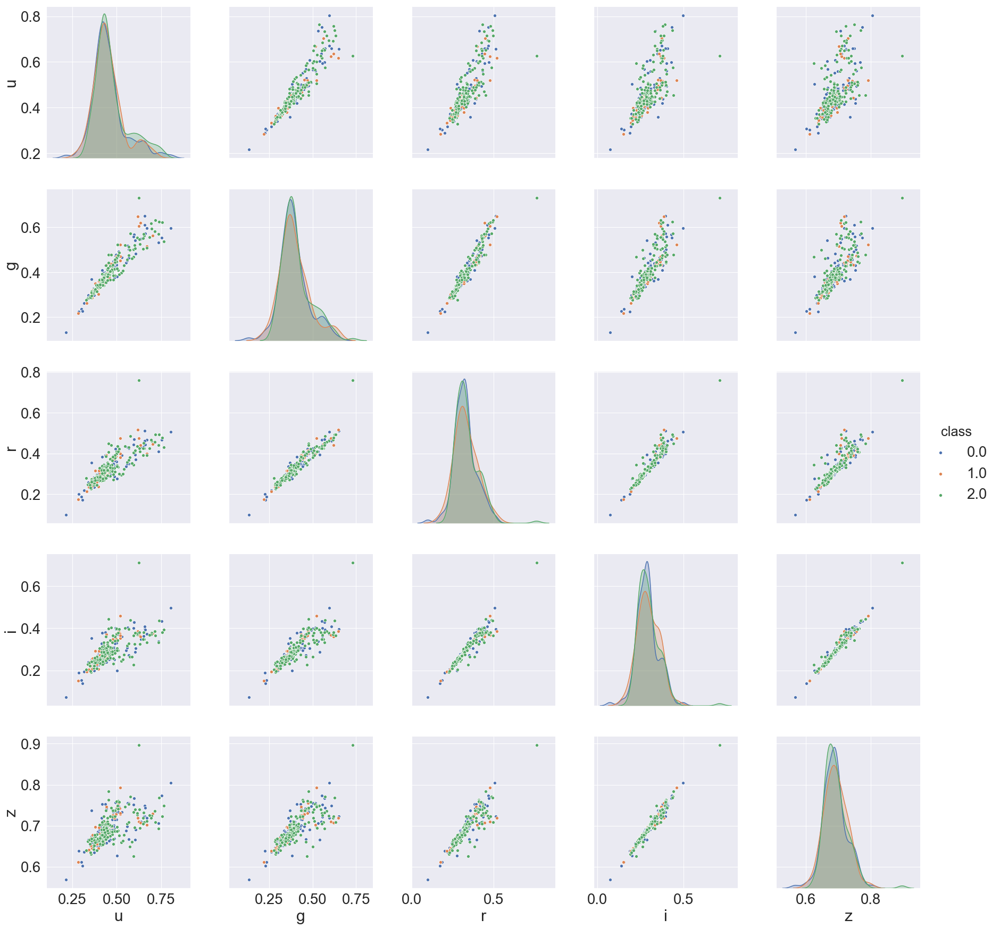

In [24]:
scaler = MinMaxScaler()
ugriz = scaler.fit_transform(train_sample[['u','g','r','i','z']])
ugriz = pd.DataFrame(ugriz, columns=['u','g','r','i','z'])
ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=ugriz, vars=['u','g','r','i','z'],hue='class', size=5)

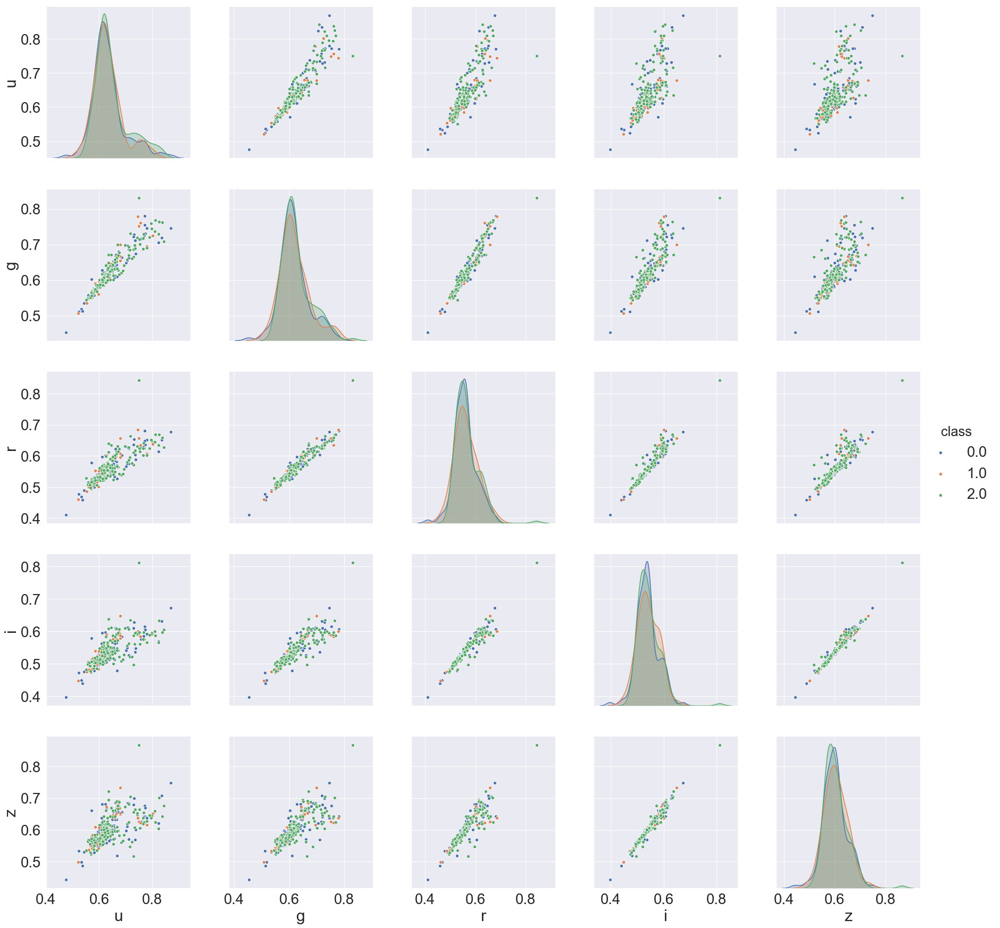

In [25]:
scaler = MaxAbsScaler()
ugriz = scaler.fit_transform(train_sample[['u','g','r','i','z']])
ugriz = pd.DataFrame(ugriz, columns=['u','g','r','i','z'])
ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=ugriz, vars=['u','g','r','i','z'],hue='class', size=5)

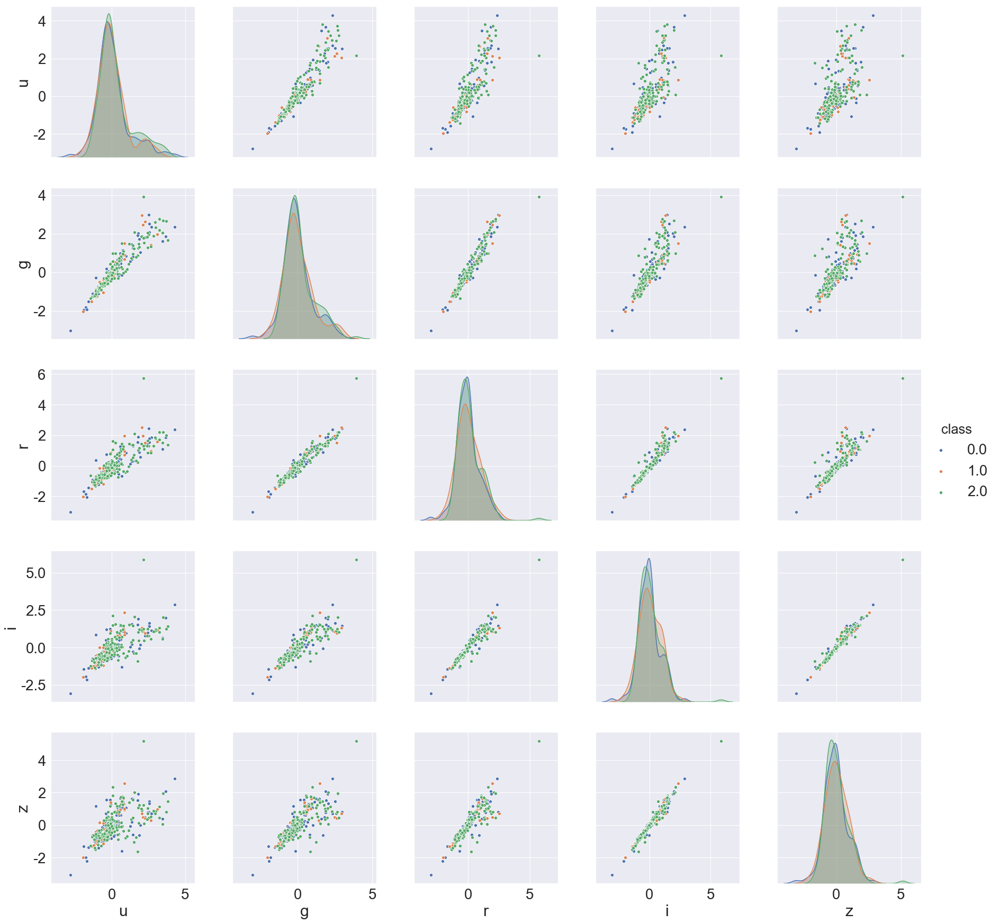

In [26]:
scaler = RobustScaler()
ugriz = scaler.fit_transform(train_sample[['u','g','r','i','z']])
ugriz = pd.DataFrame(ugriz, columns=['u','g','r','i','z'])
ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=ugriz, vars=['u','g','r','i','z'],hue='class', size=5)

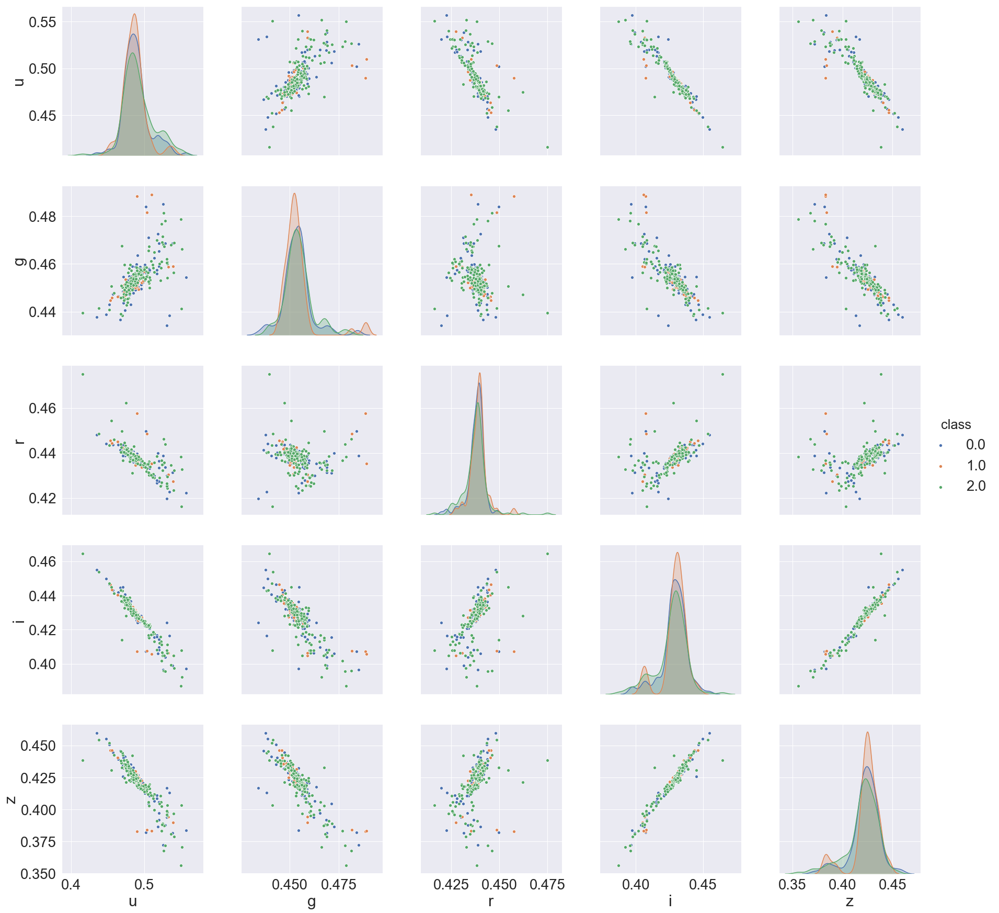

In [27]:
scaler = Normalizer()
ugriz = scaler.fit_transform(train_sample[['u','g','r','i','z']])
ugriz = pd.DataFrame(ugriz, columns=['u','g','r','i','z'])
ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=ugriz, vars=['u','g','r','i','z'],hue='class', size=5)

### dered_ugriz에 대해서 스케일링

In [28]:
train_sample.head()

,u,g,r,i,z,redshift,dered_u,dered_g,dered_r,dered_i,dered_z,nObserve,nDetect,airmass_u,airmass_g,airmass_r,airmass_i,airmass_z,class
id,,,,,,,,,,,,,,,,,,,
40047,19.9919,18.9708,18.3839,18.0328,17.7959,0.0857,19.7148,18.7205,18.2146,17.9112,17.7365,21,20,1.1985,1.1990,1.1982,1.1983,1.1987,2
240841,19.2634,17.7903,17.0643,16.6247,16.2894,0.0584,19.2405,17.7504,17.0372,16.6054,16.2806,1,1,1.1083,1.1129,1.1038,1.1060,1.1106,2
89303,19.4655,18.2111,17.4701,17.0306,16.7544,0.1239,19.3278,18.1116,17.4011,16.9788,16.7127,1,1,1.1886,1.1954,1.1820,1.1852,1.1919,2
293055,18.6142,17.3839,17.3541,17.4033,17.4311,-0.0002,18.5441,17.3261,17.3151,17.3752,17.4139,1,1,1.0172,1.0162,1.0184,1.0178,1.0167,0
140948,18.8011,17.9585,17.7282,17.4856,17.4884,0.1103,18.6984,17.8546,17.6612,17.4415,17.4933,3,3,1.0902,1.0930,1.0875,1.0889,1.0916,1


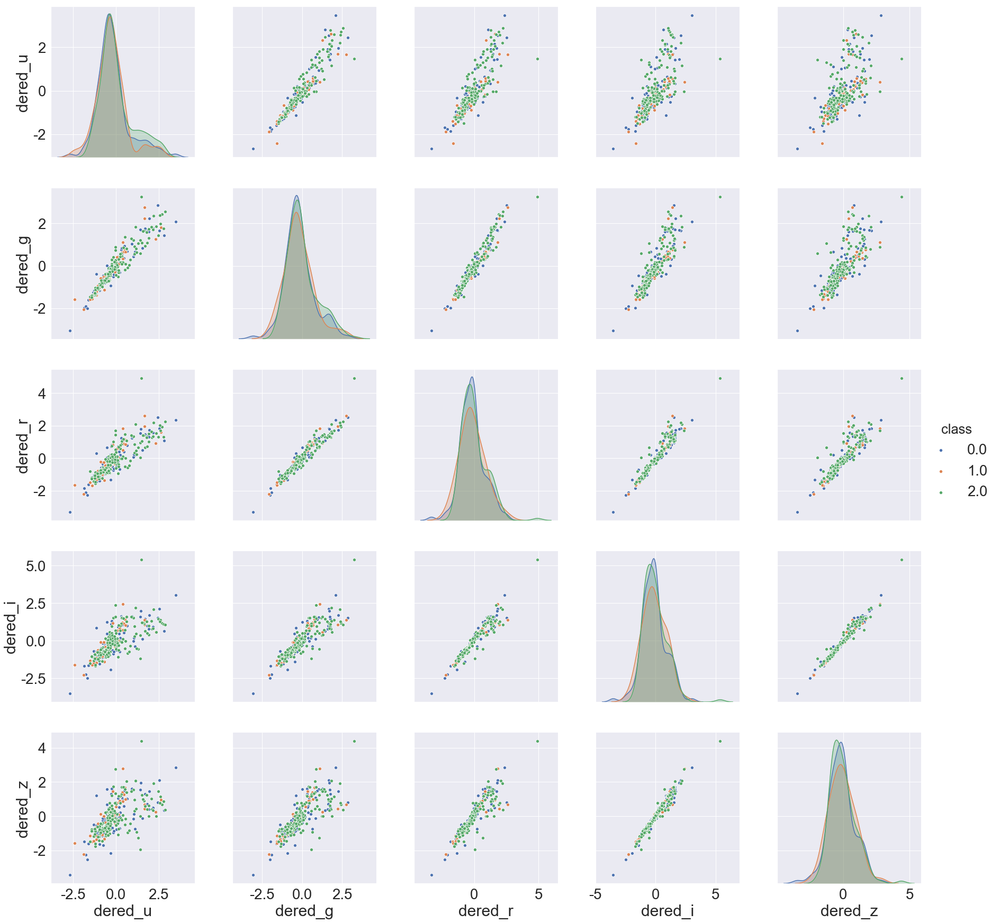

In [29]:
scaler = StandardScaler()
dered_ugriz = scaler.fit_transform(train_sample[['dered_u','dered_g','dered_r','dered_i','dered_z']])
dered_ugriz = pd.DataFrame(dered_ugriz, columns=['dered_u','dered_g','dered_r','dered_i','dered_z'])
dered_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=dered_ugriz, vars=['dered_u','dered_g','dered_r','dered_i','dered_z'],hue='class', size=5)

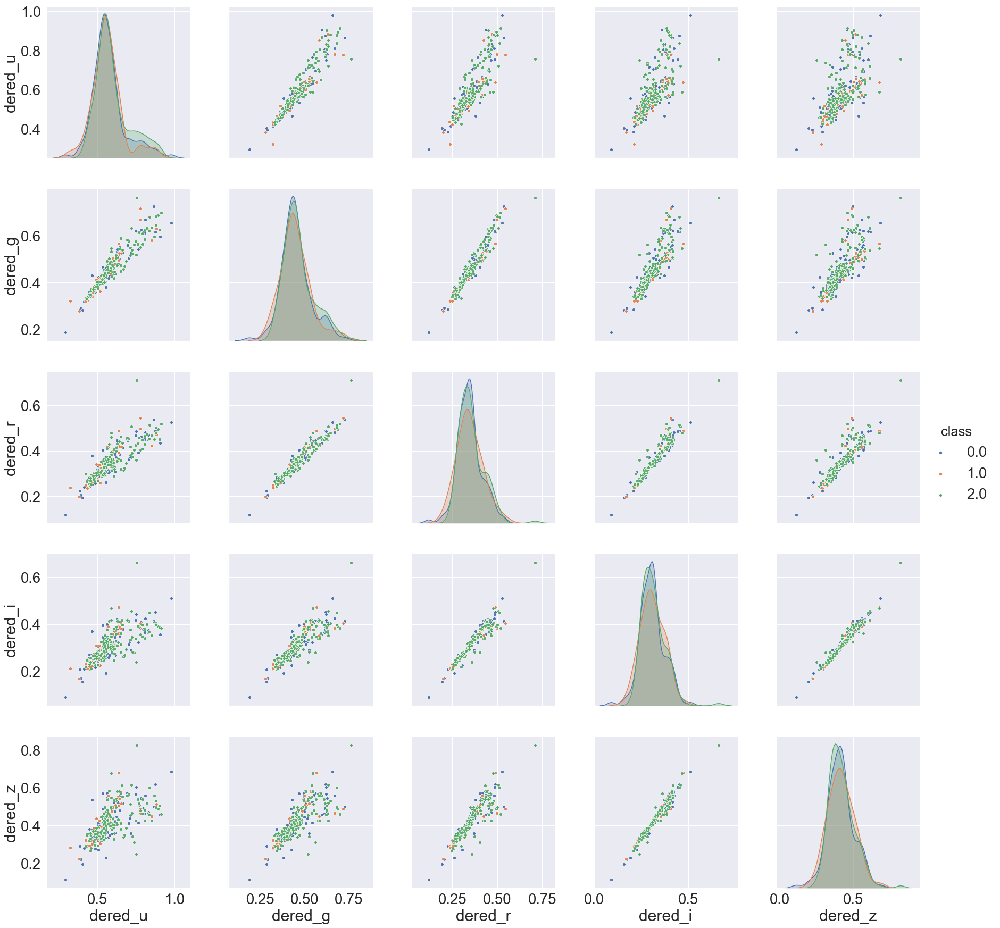

In [30]:
scaler = MinMaxScaler()
dered_ugriz = scaler.fit_transform(train_sample[['dered_u','dered_g','dered_r','dered_i','dered_z']])
dered_ugriz = pd.DataFrame(dered_ugriz, columns=['dered_u','dered_g','dered_r','dered_i','dered_z'])
dered_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=dered_ugriz, vars=['dered_u','dered_g','dered_r','dered_i','dered_z'],hue='class', size=5)

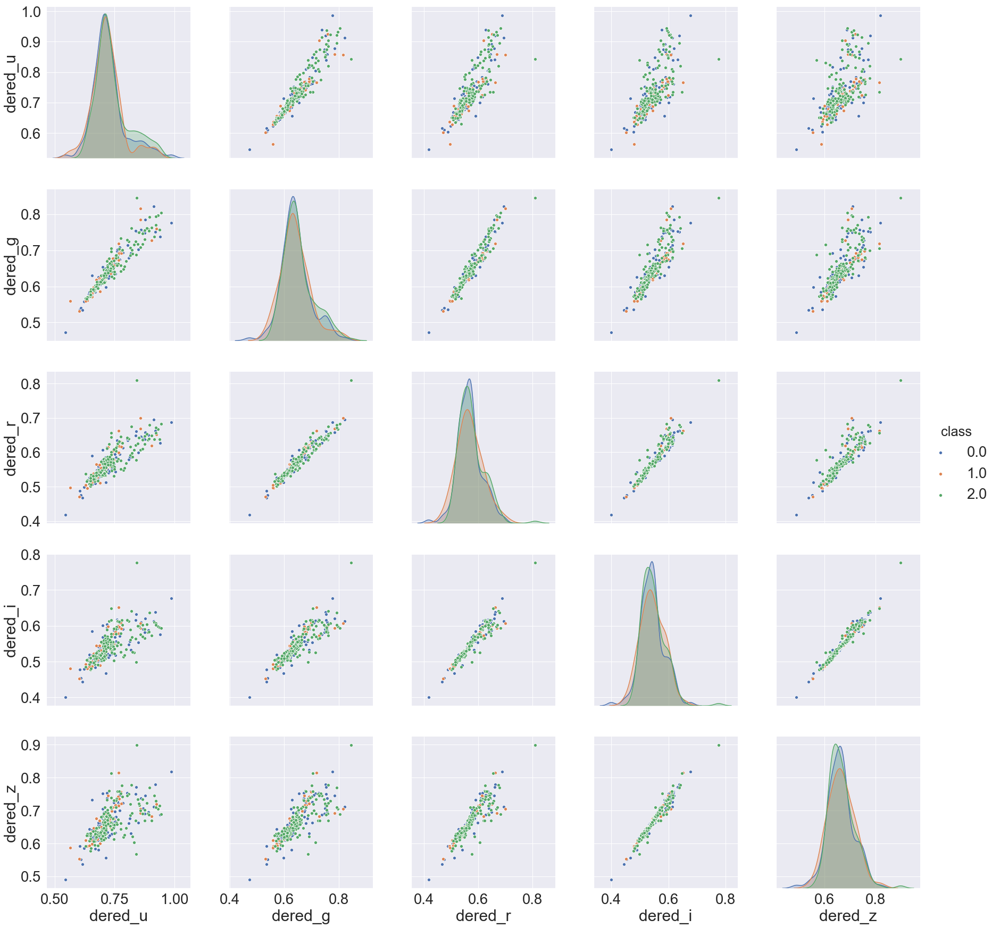

In [31]:
scaler = MaxAbsScaler()
dered_ugriz = scaler.fit_transform(train_sample[['dered_u','dered_g','dered_r','dered_i','dered_z']])
dered_ugriz = pd.DataFrame(dered_ugriz, columns=['dered_u','dered_g','dered_r','dered_i','dered_z'])
dered_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=dered_ugriz, vars=['dered_u','dered_g','dered_r','dered_i','dered_z'],hue='class', size=5)

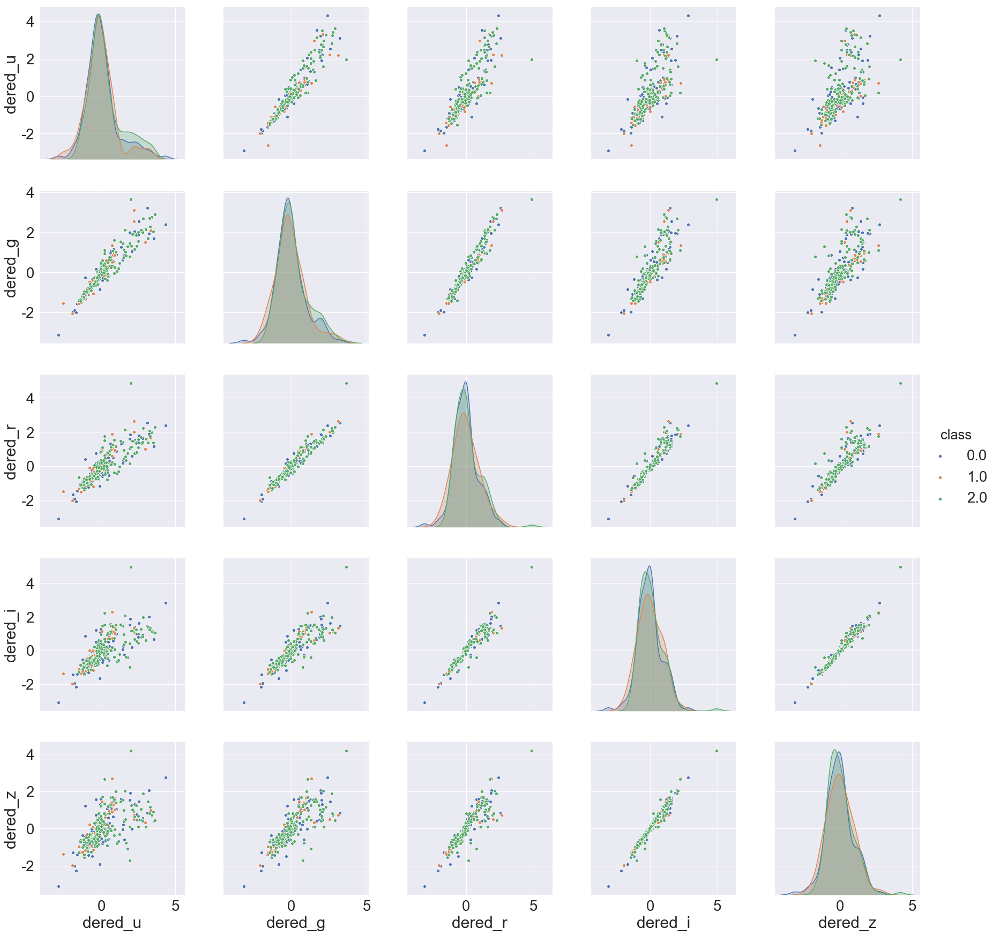

In [32]:
scaler = RobustScaler()
dered_ugriz = scaler.fit_transform(train_sample[['dered_u','dered_g','dered_r','dered_i','dered_z']])
dered_ugriz = pd.DataFrame(dered_ugriz, columns=['dered_u','dered_g','dered_r','dered_i','dered_z'])
dered_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=dered_ugriz, vars=['dered_u','dered_g','dered_r','dered_i','dered_z'],hue='class', size=5)

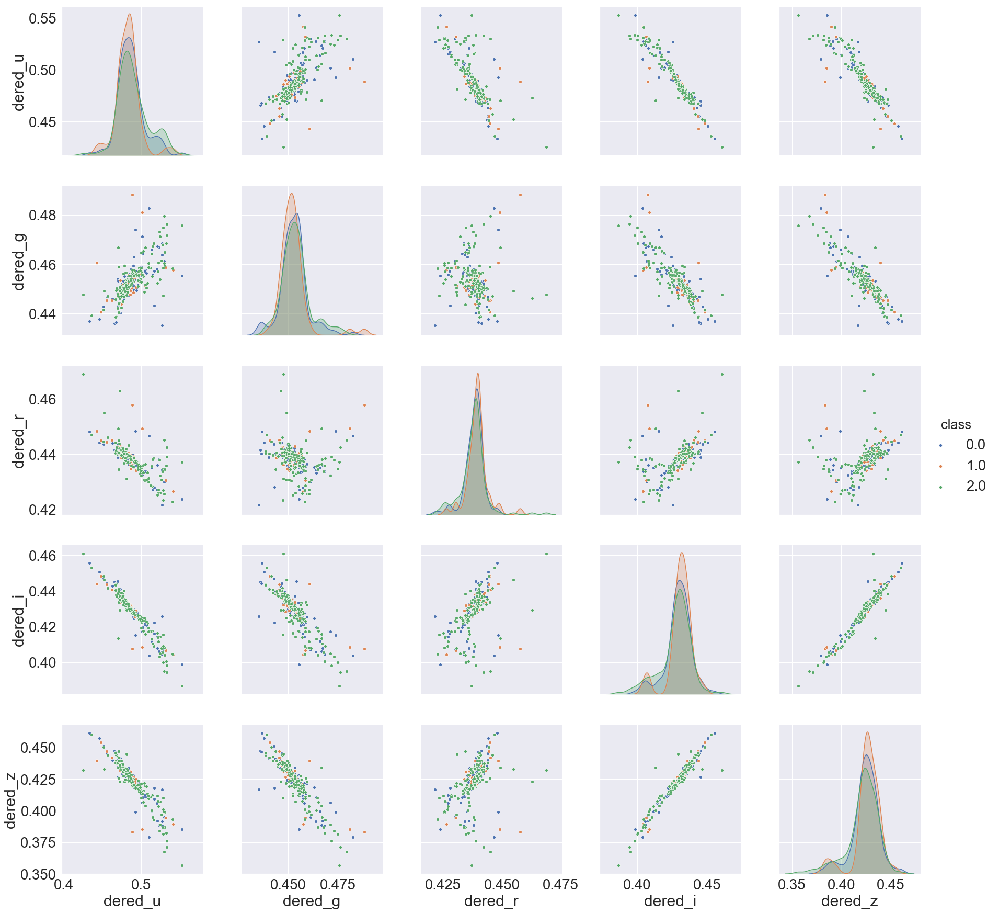

In [33]:
scaler = Normalizer()
dered_ugriz = scaler.fit_transform(train_sample[['dered_u','dered_g','dered_r','dered_i','dered_z']])
dered_ugriz = pd.DataFrame(dered_ugriz, columns=['dered_u','dered_g','dered_r','dered_i','dered_z'])
dered_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=dered_ugriz, vars=['dered_u','dered_g','dered_r','dered_i','dered_z'],hue='class', size=5)

### airmass_ugriz에 대해서 스케일링

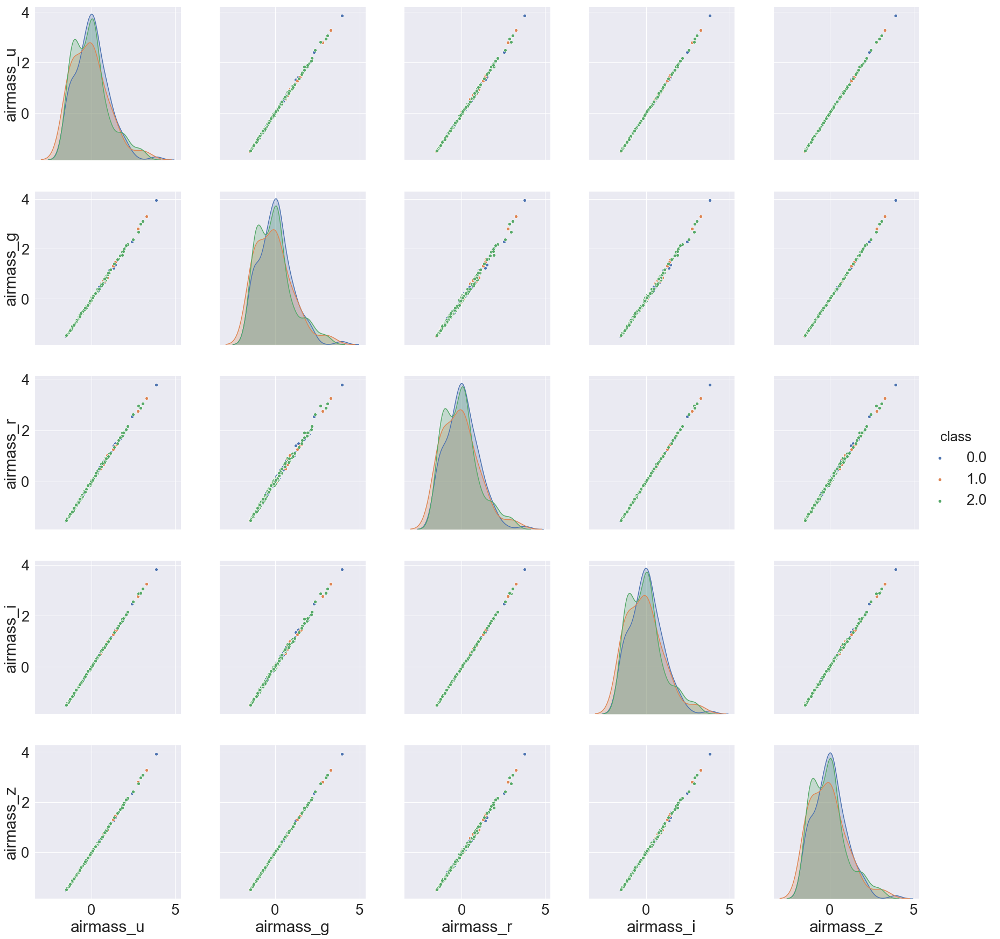

In [34]:
scaler = StandardScaler()
airmass_ugriz = scaler.fit_transform(train_sample[['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']])
airmass_ugriz = pd.DataFrame(airmass_ugriz, columns=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'])
airmass_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=airmass_ugriz, vars=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'],hue='class', size=5)

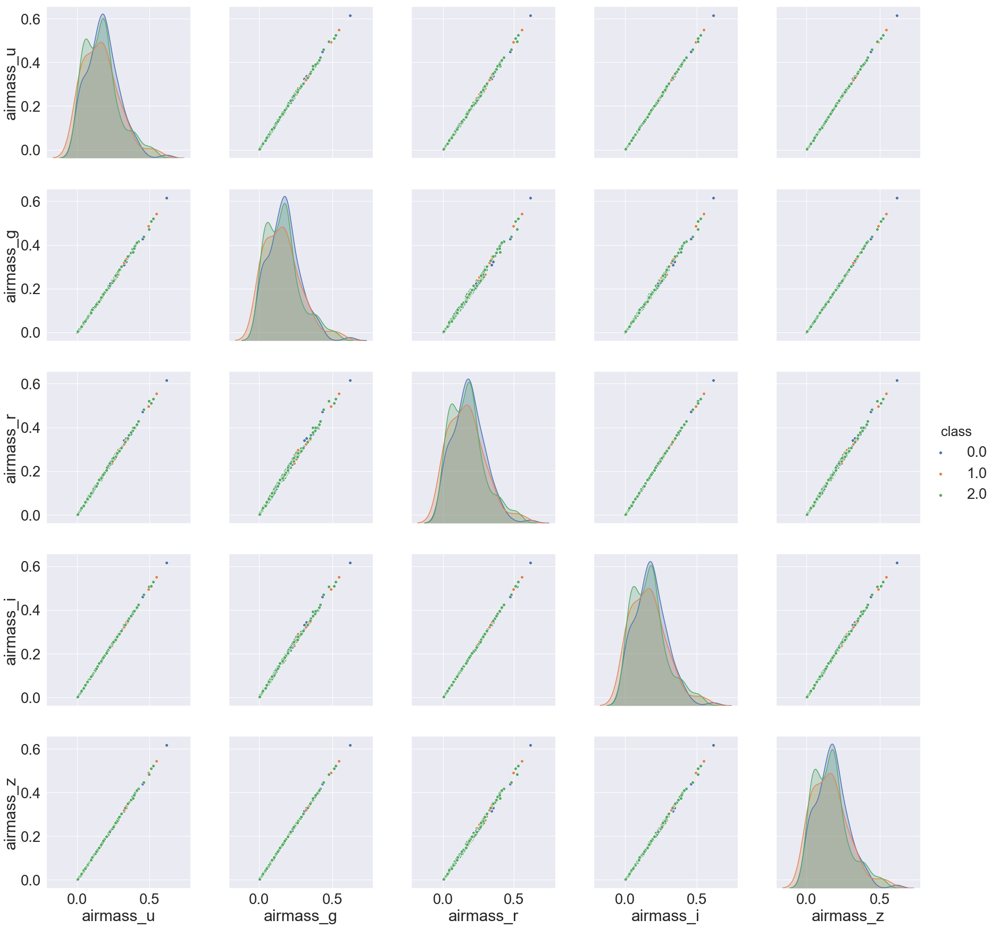

In [35]:
scaler = MinMaxScaler()
airmass_ugriz = scaler.fit_transform(train_sample[['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']])
airmass_ugriz = pd.DataFrame(airmass_ugriz, columns=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'])
airmass_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=airmass_ugriz, vars=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'],hue='class', size=5)

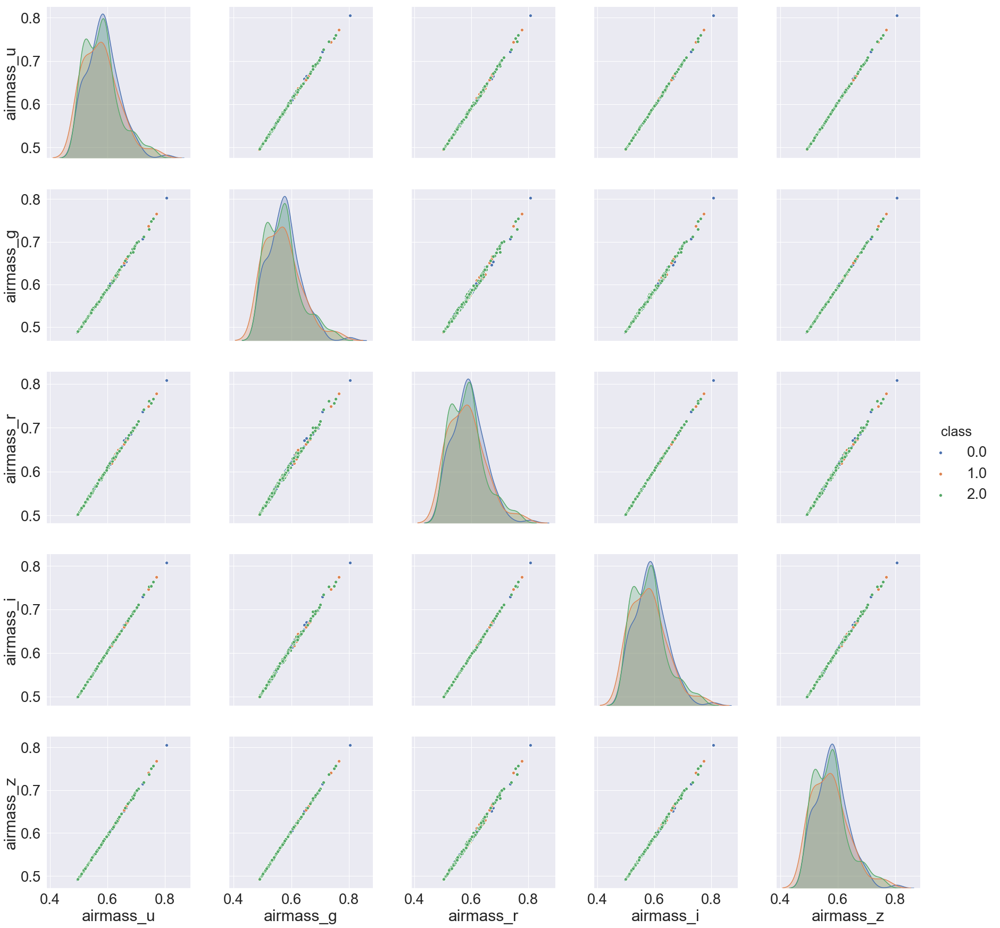

In [36]:
scaler = MaxAbsScaler()
airmass_ugriz = scaler.fit_transform(train_sample[['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']])
airmass_ugriz = pd.DataFrame(airmass_ugriz, columns=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'])
airmass_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=airmass_ugriz, vars=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'],hue='class', size=5)

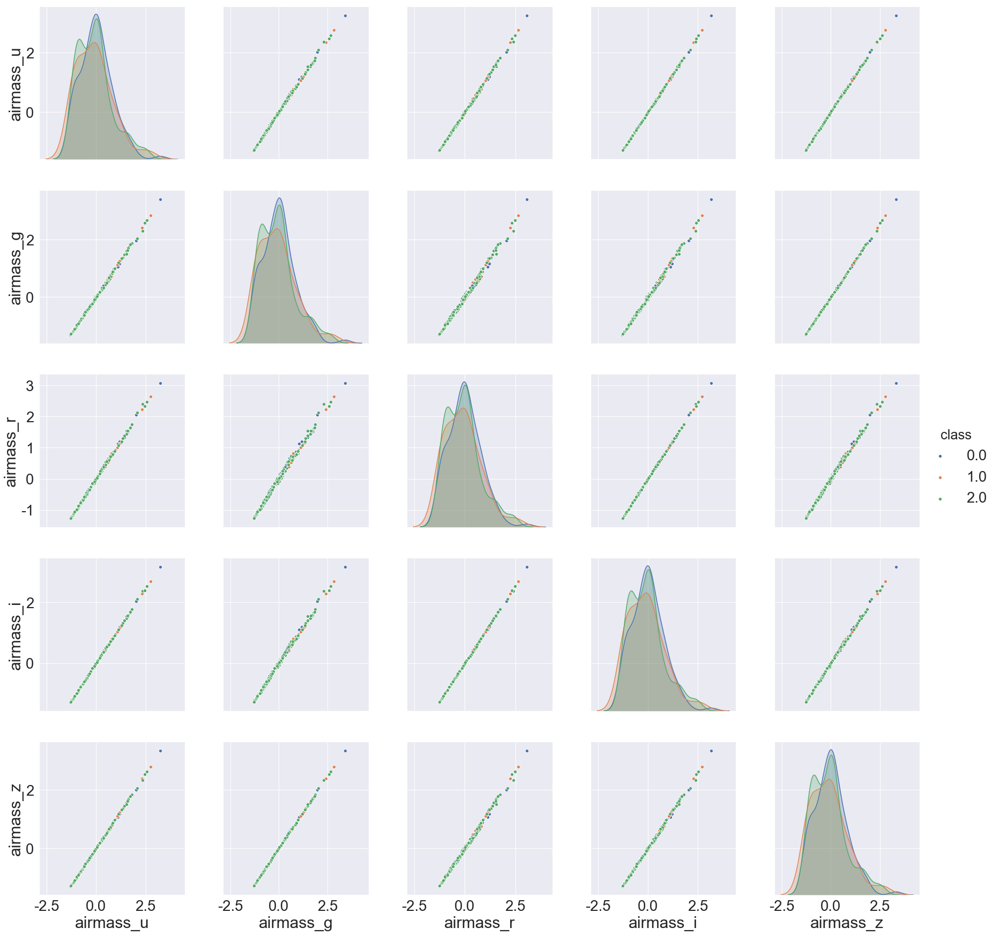

In [37]:
scaler = RobustScaler()
airmass_ugriz = scaler.fit_transform(train_sample[['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']])
airmass_ugriz = pd.DataFrame(airmass_ugriz, columns=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'])
airmass_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=airmass_ugriz, vars=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'],hue='class', size=5)

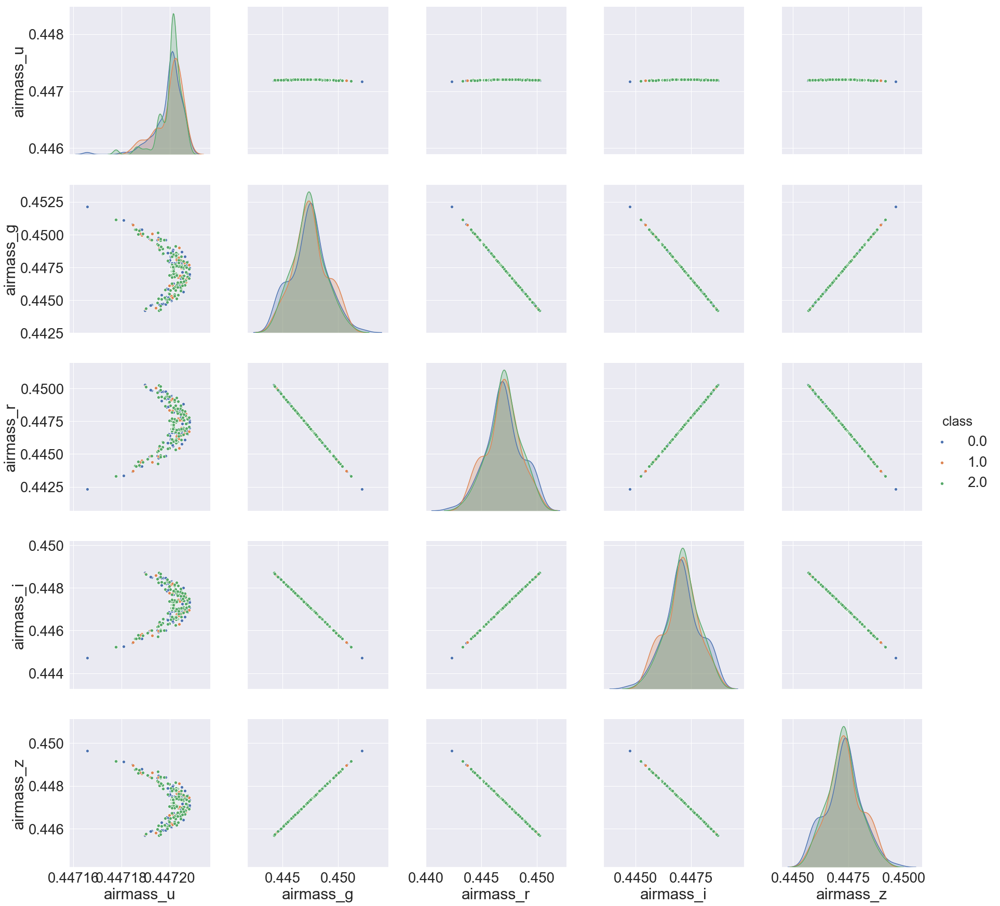

In [38]:
scaler = Normalizer()
airmass_ugriz = scaler.fit_transform(train_sample[['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z']])
airmass_ugriz = pd.DataFrame(airmass_ugriz, columns=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'])
airmass_ugriz['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=airmass_ugriz, vars=['airmass_u','airmass_g','airmass_r','airmass_i','airmass_z'],hue='class', size=5)

### X, dered_X, airmaxx_X에 대하여 스케일링

#### u

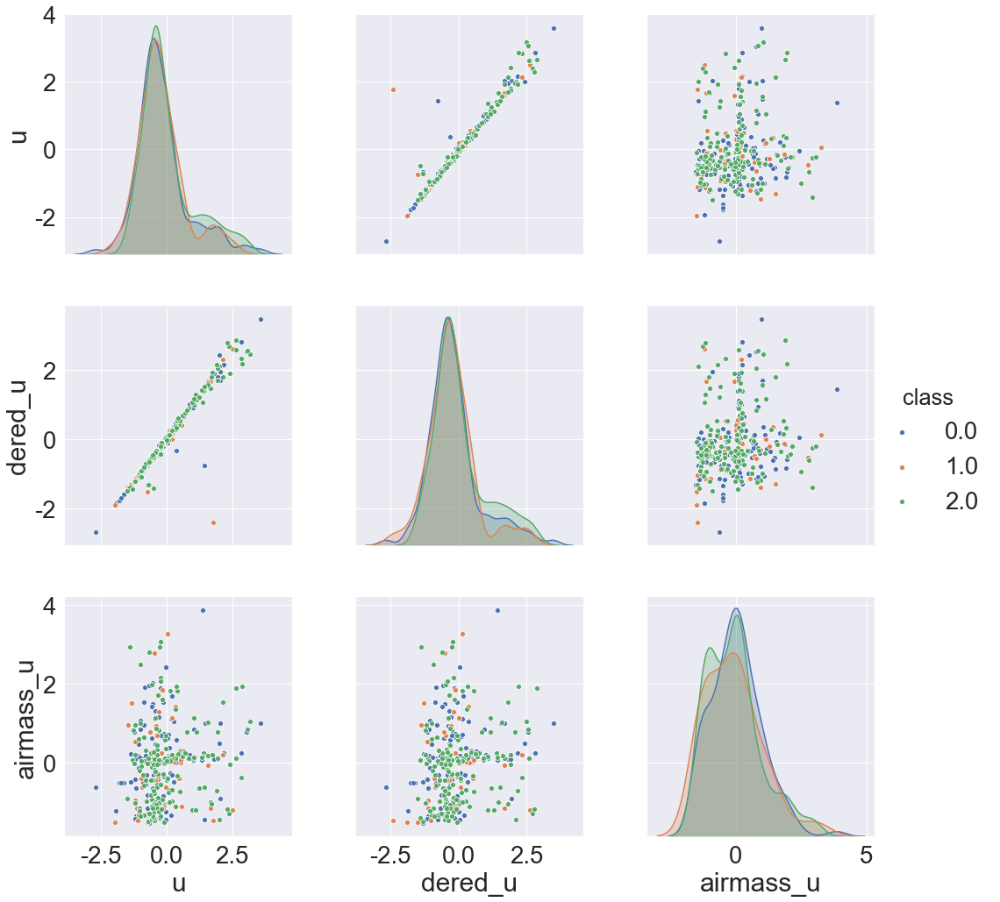

In [39]:
scaler = StandardScaler()
u_dered_airamss = scaler.fit_transform(train_sample[['u','dered_u','airmass_u']])
u_dered_airamss = pd.DataFrame(u_dered_airamss, columns = ['u','dered_u','airmass_u'])
u_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=u_dered_airamss, vars=['u','dered_u','airmass_u'],hue='class', size=5)

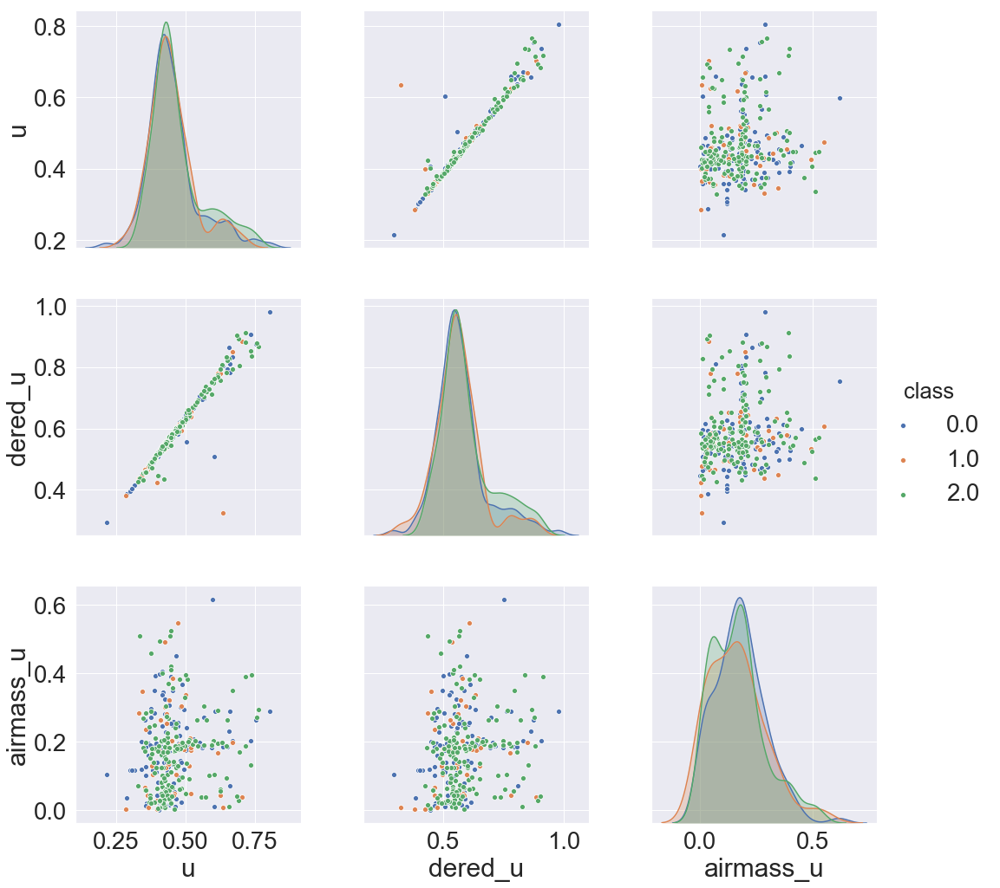

In [40]:
scaler = MinMaxScaler()
u_dered_airamss = scaler.fit_transform(train_sample[['u','dered_u','airmass_u']])
u_dered_airamss = pd.DataFrame(u_dered_airamss, columns = ['u','dered_u','airmass_u'])
u_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=u_dered_airamss, vars=['u','dered_u','airmass_u'],hue='class', size=5)

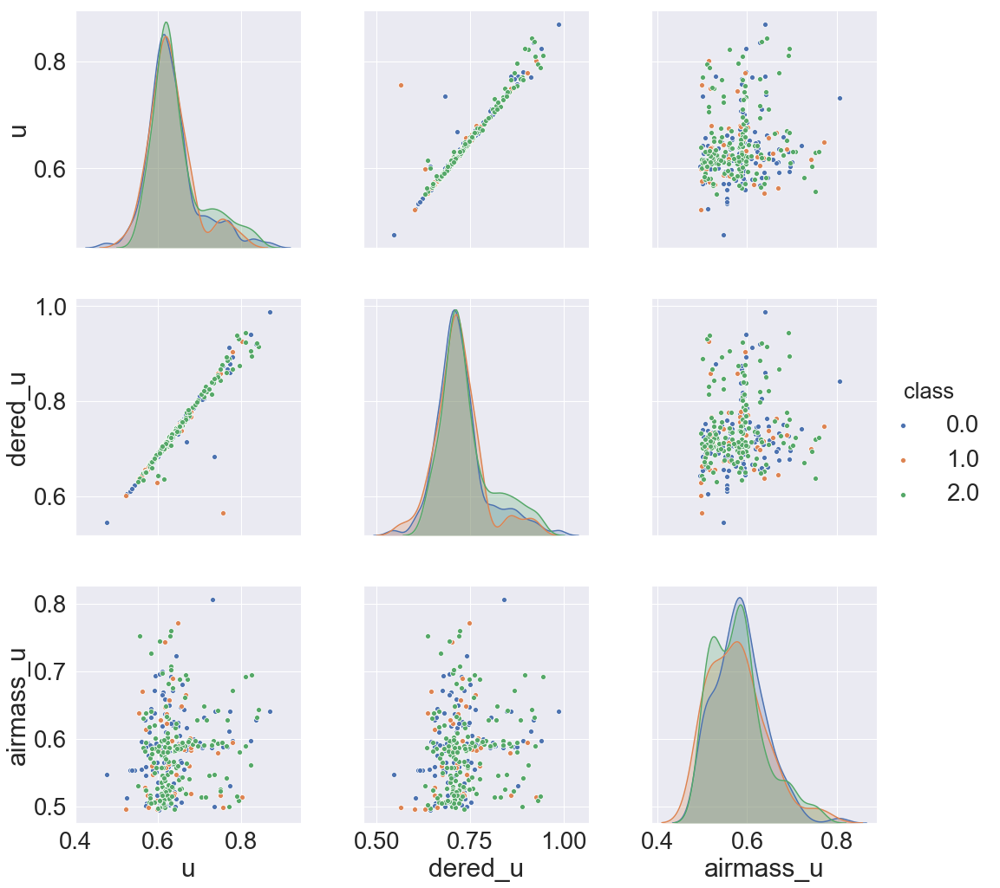

In [41]:
scaler = MaxAbsScaler()
u_dered_airamss = scaler.fit_transform(train_sample[['u','dered_u','airmass_u']])
u_dered_airamss = pd.DataFrame(u_dered_airamss, columns = ['u','dered_u','airmass_u'])
u_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=u_dered_airamss, vars=['u','dered_u','airmass_u'],hue='class', size=5)

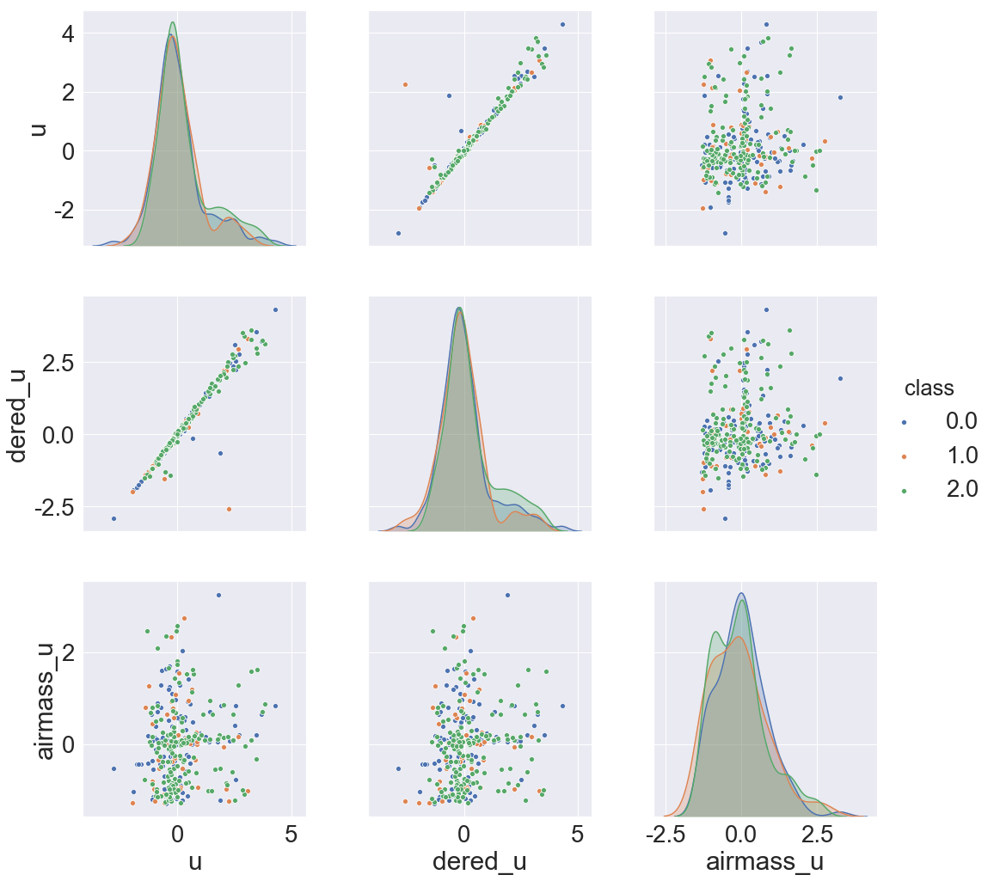

In [42]:
scaler = RobustScaler()
u_dered_airamss = scaler.fit_transform(train_sample[['u','dered_u','airmass_u']])
u_dered_airamss = pd.DataFrame(u_dered_airamss, columns = ['u','dered_u','airmass_u'])
u_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=u_dered_airamss, vars=['u','dered_u','airmass_u'],hue='class', size=5)

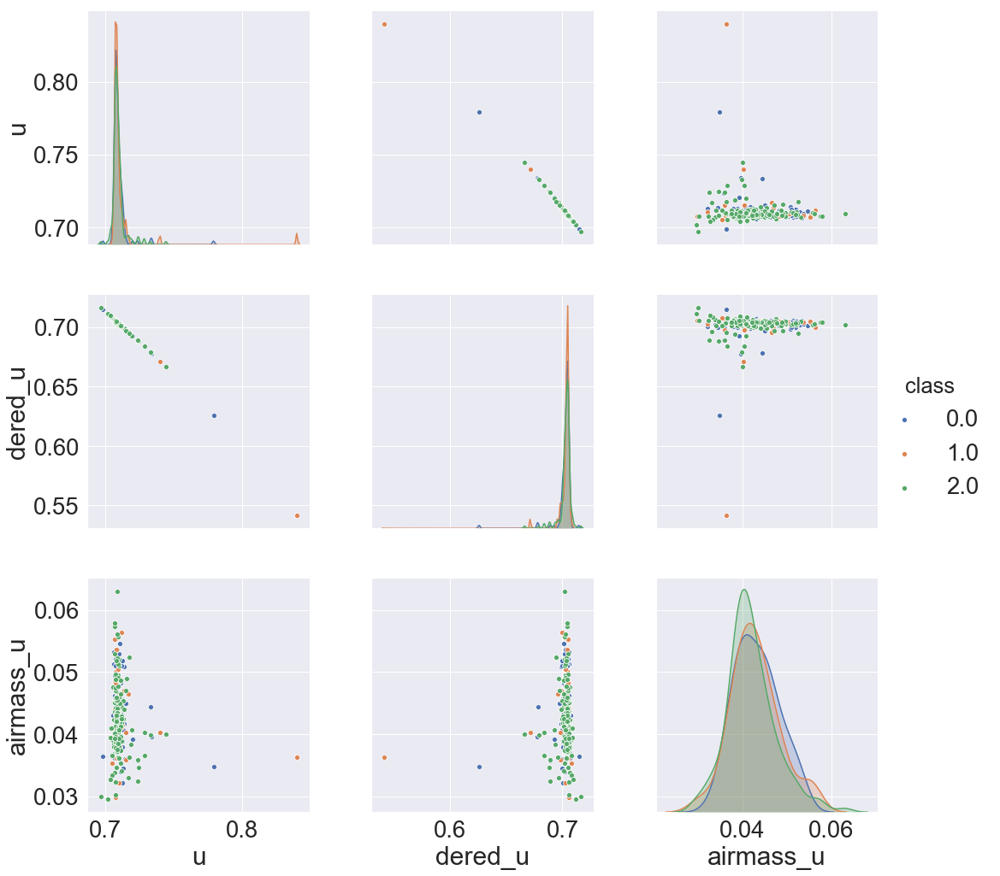

In [43]:
scaler = Normalizer()
u_dered_airamss = scaler.fit_transform(train_sample[['u','dered_u','airmass_u']])
u_dered_airamss = pd.DataFrame(u_dered_airamss, columns = ['u','dered_u','airmass_u'])
u_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=u_dered_airamss, vars=['u','dered_u','airmass_u'],hue='class', size=5)

#### g

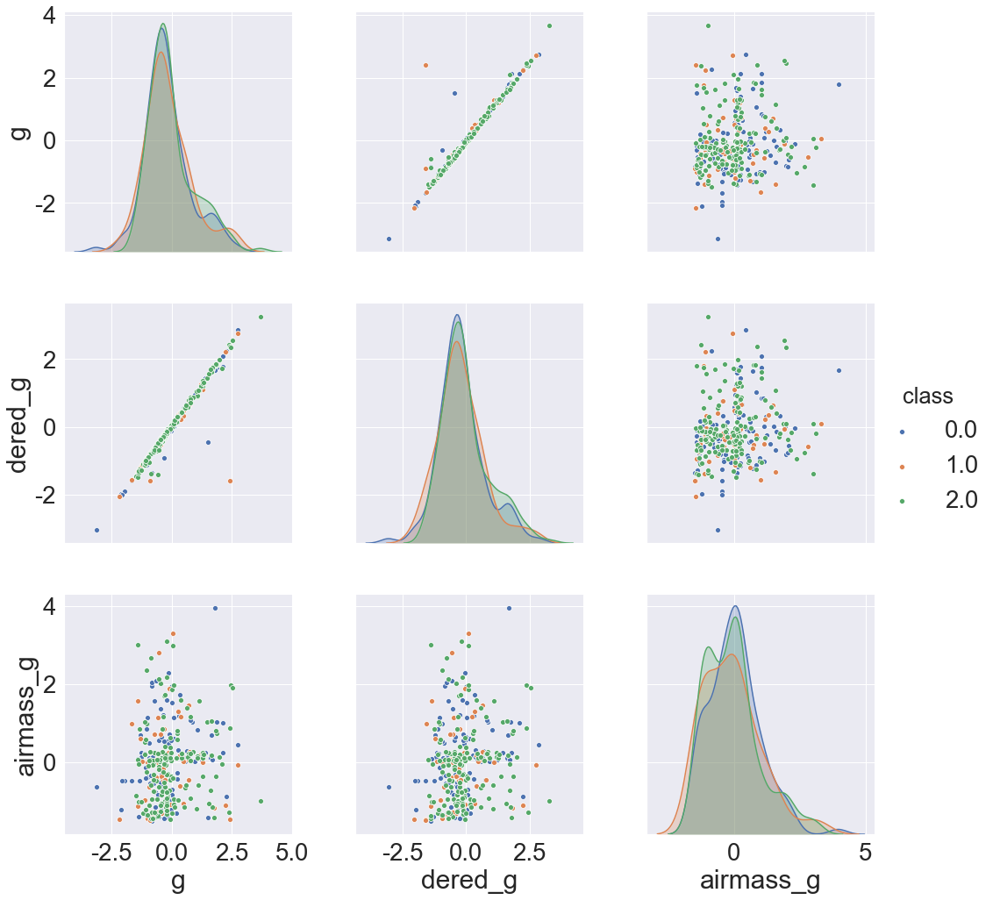

In [44]:
scaler = StandardScaler()
g_dered_airamss = scaler.fit_transform(train_sample[['g','dered_g','airmass_g']])
g_dered_airamss = pd.DataFrame(g_dered_airamss, columns = ['g','dered_g','airmass_g'])
g_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=g_dered_airamss, vars=['g','dered_g','airmass_g'],hue='class', size=5)

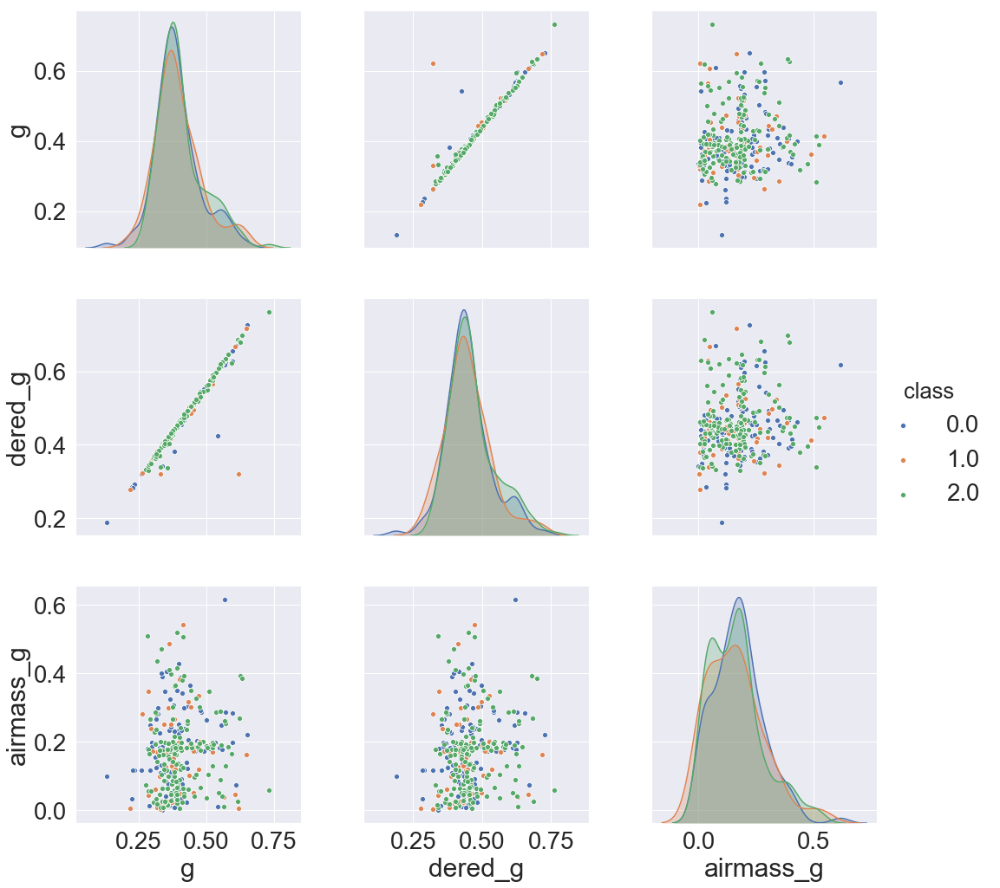

In [45]:
scaler = MinMaxScaler()
g_dered_airamss = scaler.fit_transform(train_sample[['g','dered_g','airmass_g']])
g_dered_airamss = pd.DataFrame(g_dered_airamss, columns = ['g','dered_g','airmass_g'])
g_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=g_dered_airamss, vars=['g','dered_g','airmass_g'],hue='class', size=5)

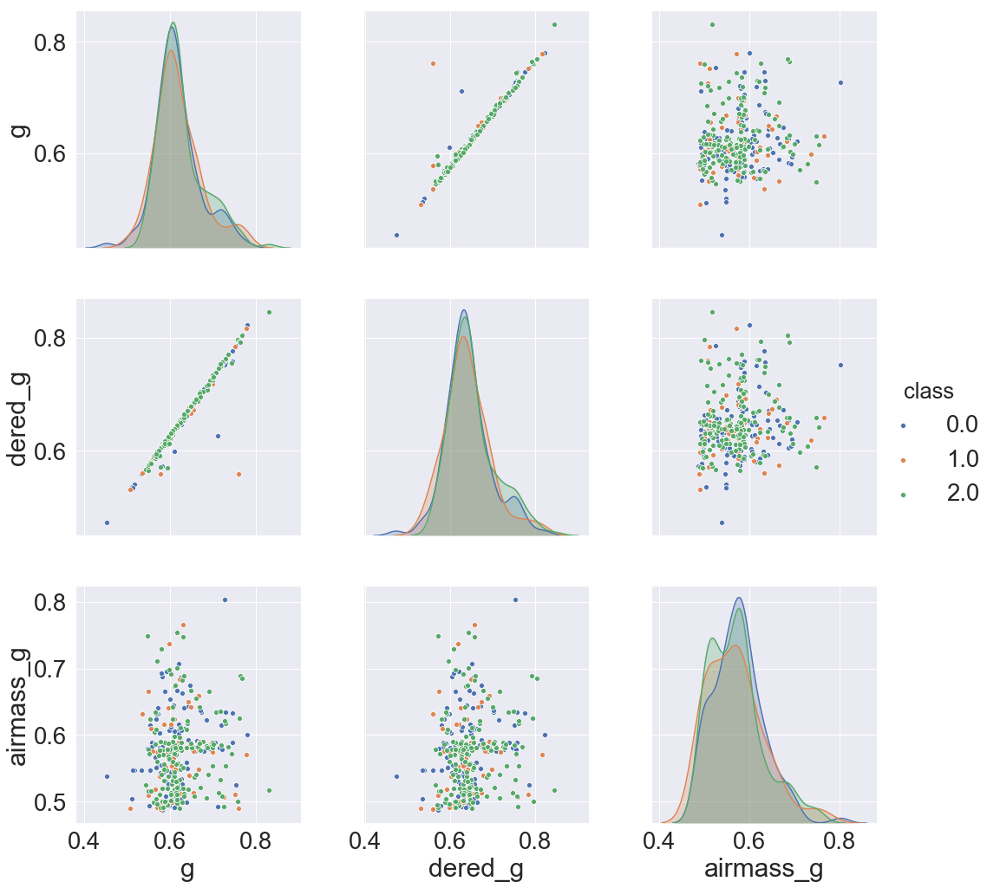

In [46]:
scaler = MaxAbsScaler()
g_dered_airamss = scaler.fit_transform(train_sample[['g','dered_g','airmass_g']])
g_dered_airamss = pd.DataFrame(g_dered_airamss, columns = ['g','dered_g','airmass_g'])
g_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=g_dered_airamss, vars=['g','dered_g','airmass_g'],hue='class', size=5)

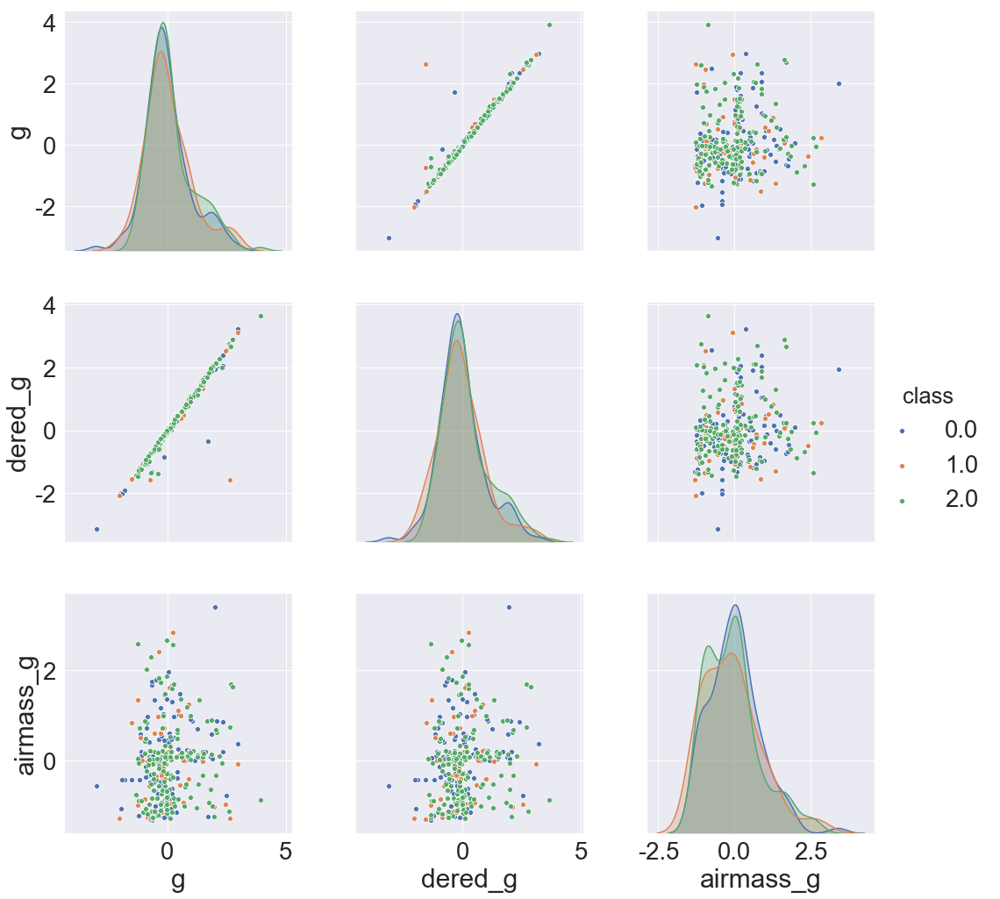

In [47]:
scaler = RobustScaler()
g_dered_airamss = scaler.fit_transform(train_sample[['g','dered_g','airmass_g']])
g_dered_airamss = pd.DataFrame(g_dered_airamss, columns = ['g','dered_g','airmass_g'])
g_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=g_dered_airamss, vars=['g','dered_g','airmass_g'],hue='class', size=5)

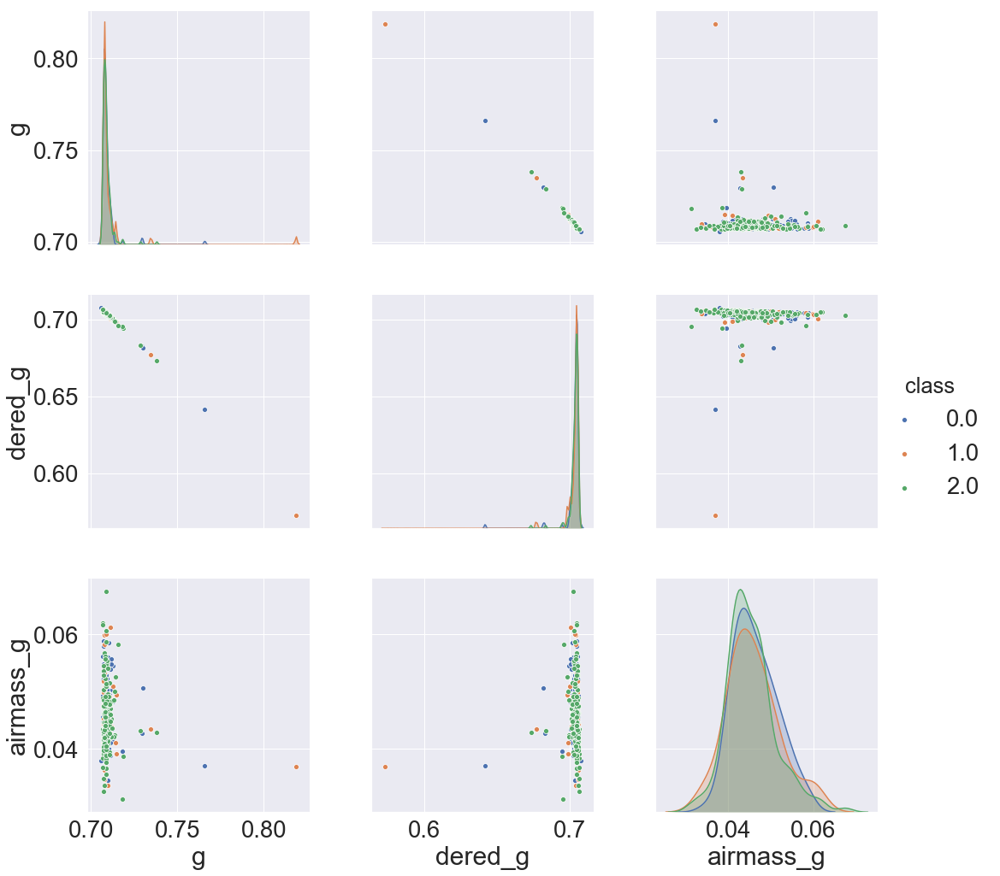

In [48]:
scaler = Normalizer()
g_dered_airamss = scaler.fit_transform(train_sample[['g','dered_g','airmass_g']])
g_dered_airamss = pd.DataFrame(g_dered_airamss, columns = ['g','dered_g','airmass_g'])
g_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=g_dered_airamss, vars=['g','dered_g','airmass_g'],hue='class', size=5)

#### r

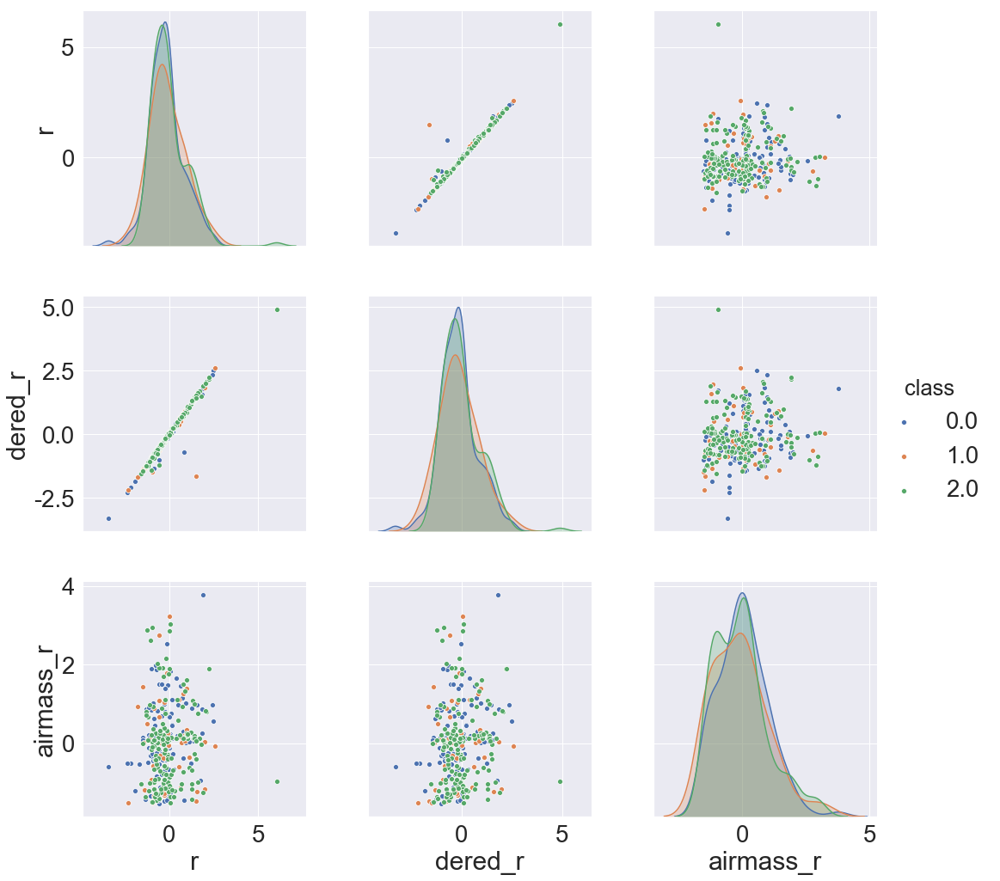

In [49]:
scaler = StandardScaler()
r_dered_airamss = scaler.fit_transform(train_sample[['r','dered_r','airmass_r']])
r_dered_airamss = pd.DataFrame(r_dered_airamss, columns = ['r','dered_r','airmass_r'])
r_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=r_dered_airamss, vars=['r','dered_r','airmass_r'],hue='class', size=5)

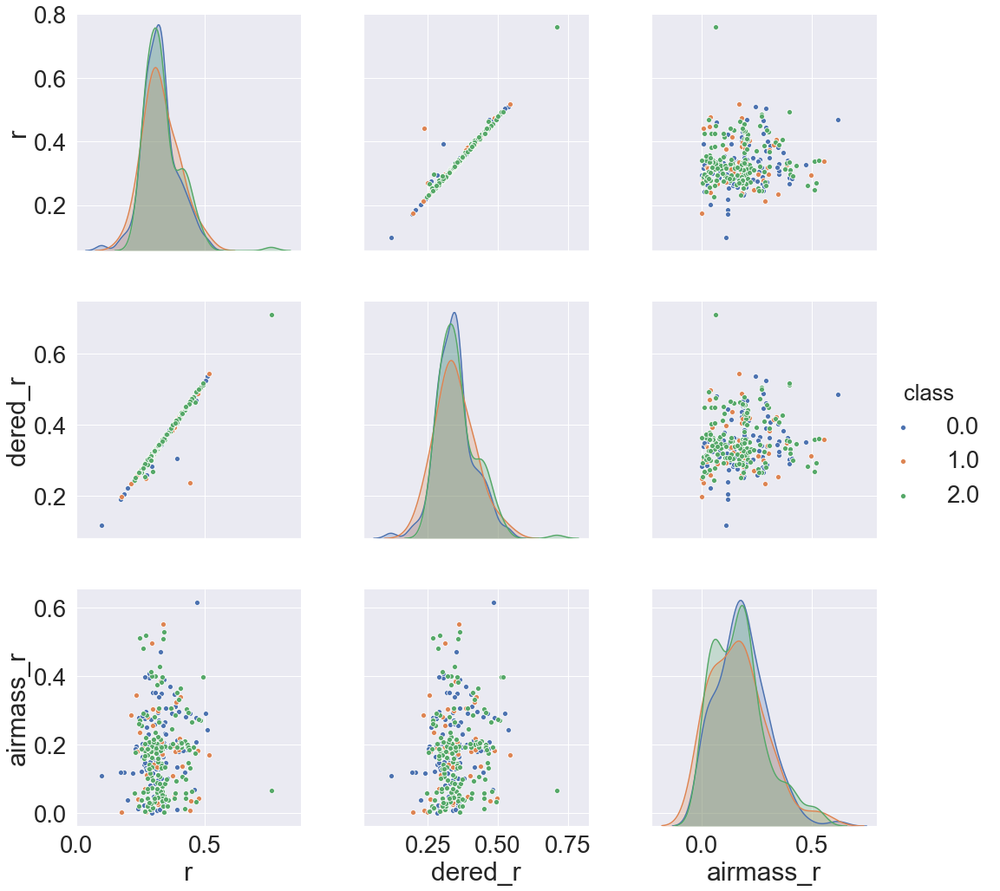

In [50]:
scaler = MinMaxScaler()
r_dered_airamss = scaler.fit_transform(train_sample[['r','dered_r','airmass_r']])
r_dered_airamss = pd.DataFrame(r_dered_airamss, columns = ['r','dered_r','airmass_r'])
r_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=r_dered_airamss, vars=['r','dered_r','airmass_r'],hue='class', size=5)

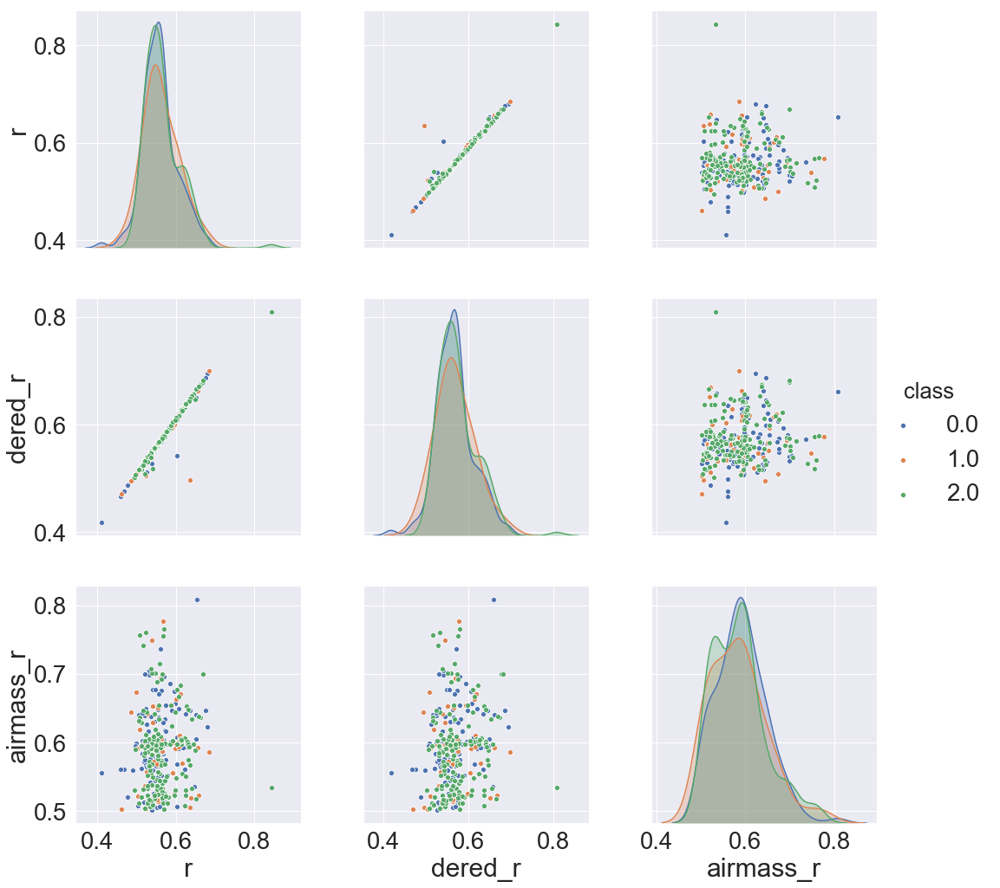

In [51]:
scaler = MaxAbsScaler()
r_dered_airamss = scaler.fit_transform(train_sample[['r','dered_r','airmass_r']])
r_dered_airamss = pd.DataFrame(r_dered_airamss, columns = ['r','dered_r','airmass_r'])
r_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=r_dered_airamss, vars=['r','dered_r','airmass_r'],hue='class', size=5)

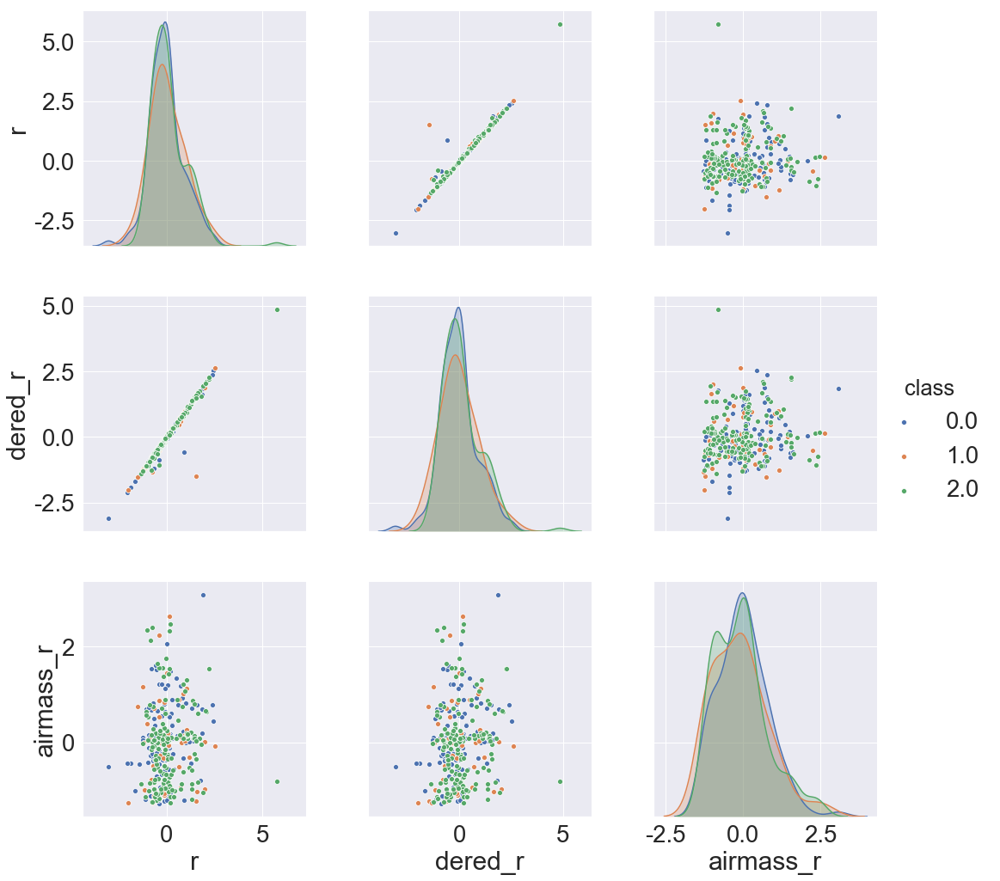

In [52]:
scaler = RobustScaler()
r_dered_airamss = scaler.fit_transform(train_sample[['r','dered_r','airmass_r']])
r_dered_airamss = pd.DataFrame(r_dered_airamss, columns = ['r','dered_r','airmass_r'])
r_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=r_dered_airamss, vars=['r','dered_r','airmass_r'],hue='class', size=5)

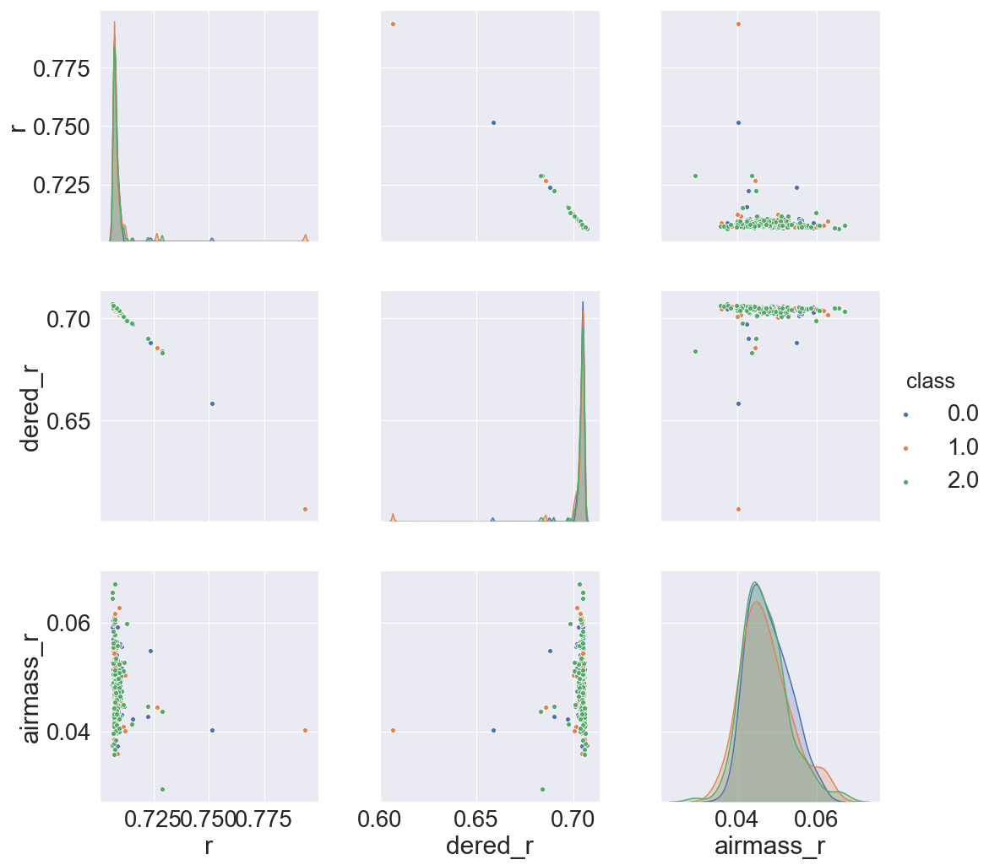

In [53]:
scaler = Normalizer()
r_dered_airamss = scaler.fit_transform(train_sample[['r','dered_r','airmass_r']])
r_dered_airamss = pd.DataFrame(r_dered_airamss, columns = ['r','dered_r','airmass_r'])
r_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=r_dered_airamss, vars=['r','dered_r','airmass_r'],hue='class', size=5)

#### i

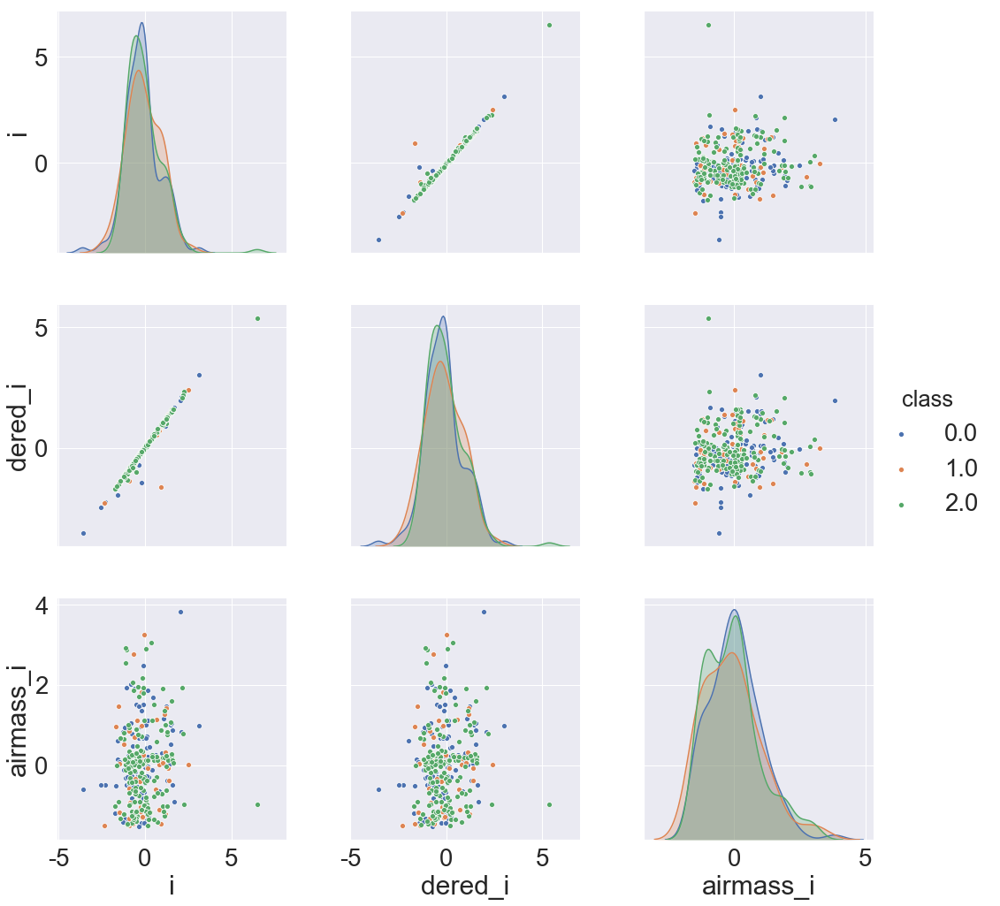

In [54]:
scaler = StandardScaler()
i_dered_airamss = scaler.fit_transform(train_sample[['i','dered_i','airmass_i']])
i_dered_airamss = pd.DataFrame(i_dered_airamss, columns = ['i','dered_i','airmass_i'])
i_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=i_dered_airamss, vars=['i','dered_i','airmass_i'],hue='class', size=5)

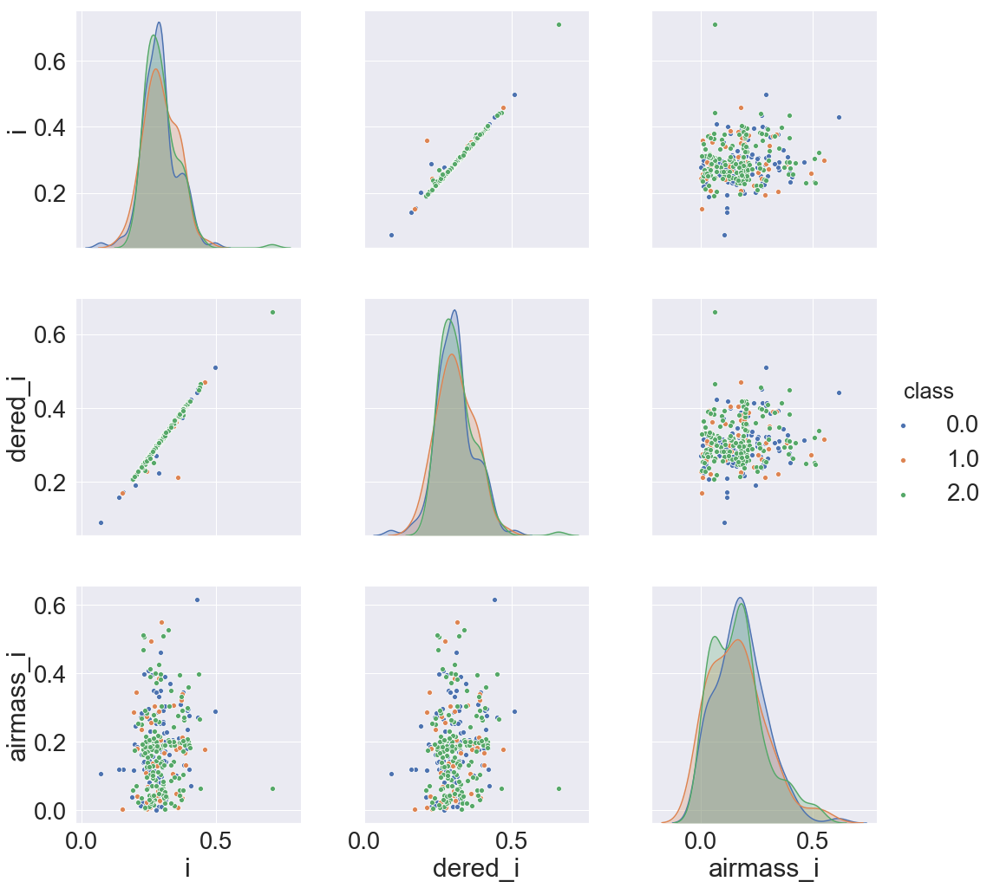

In [55]:
scaler = MinMaxScaler()
i_dered_airamss = scaler.fit_transform(train_sample[['i','dered_i','airmass_i']])
i_dered_airamss = pd.DataFrame(i_dered_airamss, columns = ['i','dered_i','airmass_i'])
i_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=i_dered_airamss, vars=['i','dered_i','airmass_i'],hue='class', size=5)

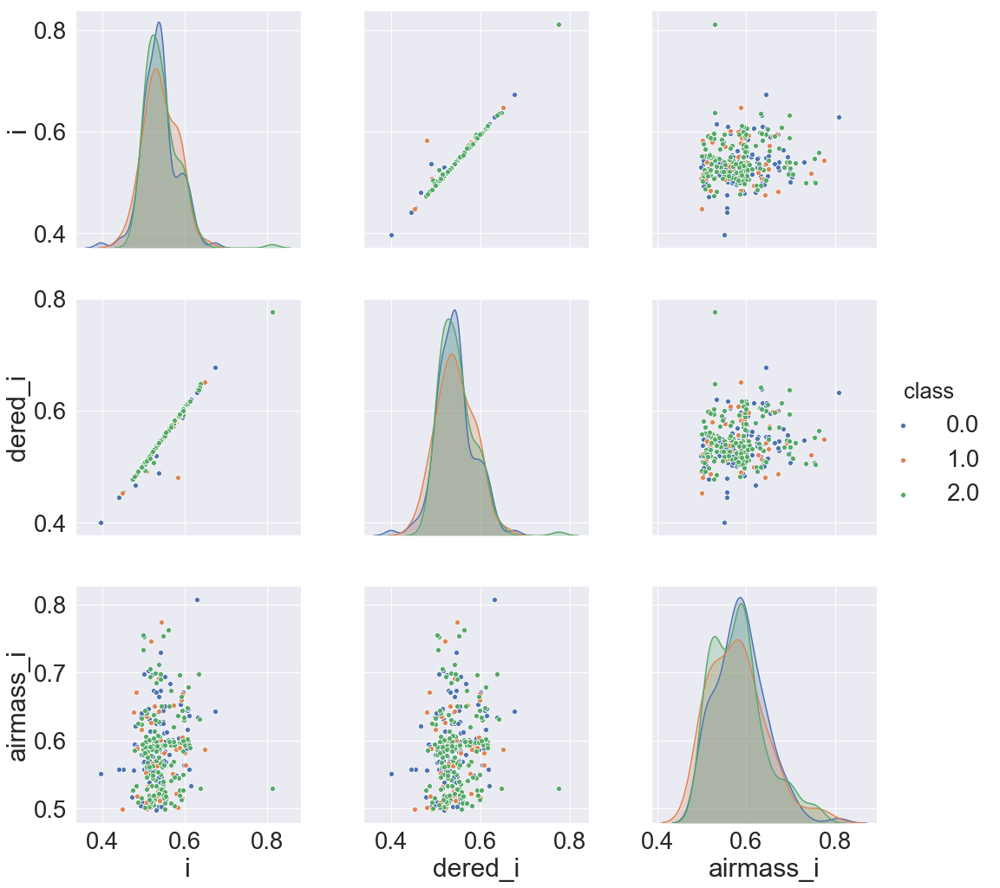

In [56]:
scaler = MaxAbsScaler()
i_dered_airamss = scaler.fit_transform(train_sample[['i','dered_i','airmass_i']])
i_dered_airamss = pd.DataFrame(i_dered_airamss, columns = ['i','dered_i','airmass_i'])
i_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=i_dered_airamss, vars=['i','dered_i','airmass_i'],hue='class', size=5)

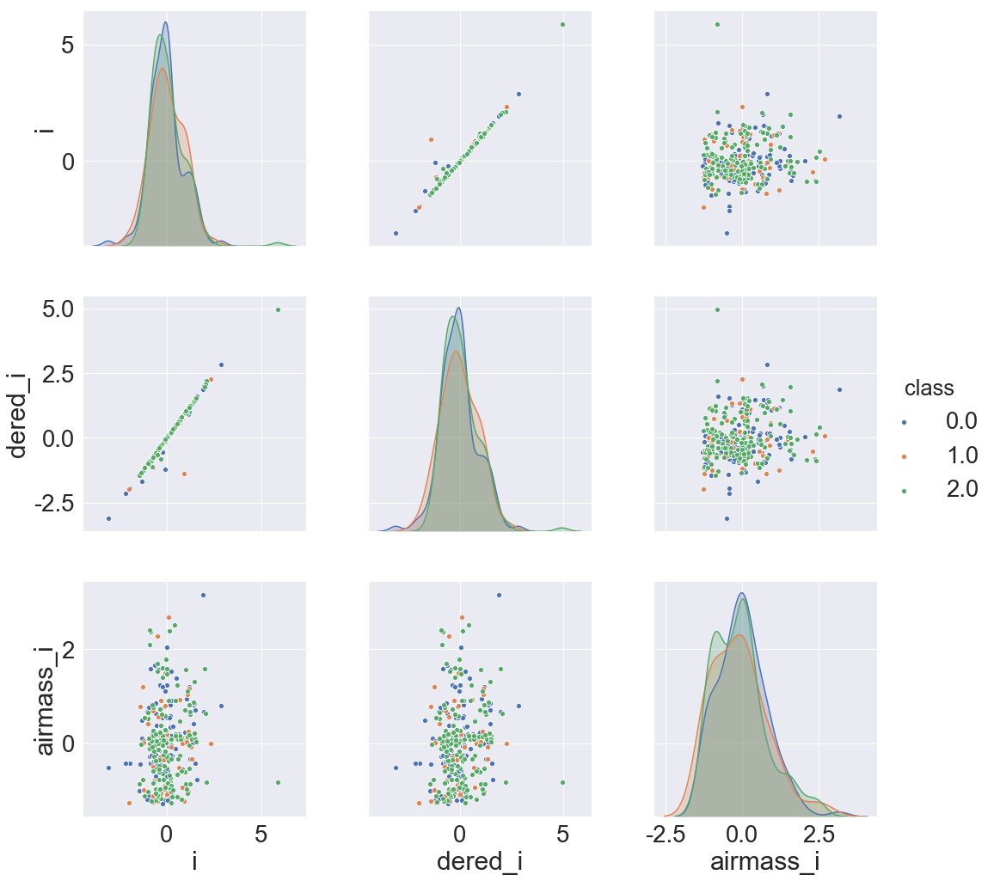

In [57]:
scaler = RobustScaler()
i_dered_airamss = scaler.fit_transform(train_sample[['i','dered_i','airmass_i']])
i_dered_airamss = pd.DataFrame(i_dered_airamss, columns = ['i','dered_i','airmass_i'])
i_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=i_dered_airamss, vars=['i','dered_i','airmass_i'],hue='class', size=5)

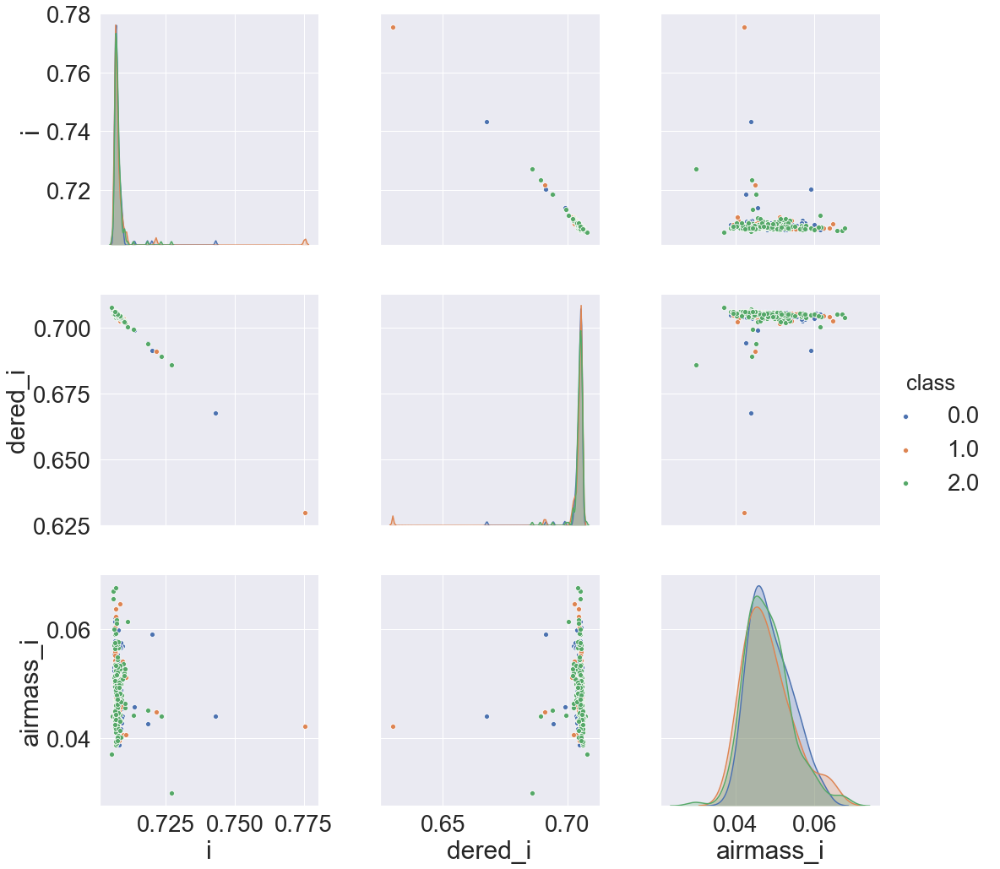

In [58]:
scaler = Normalizer()
i_dered_airamss = scaler.fit_transform(train_sample[['i','dered_i','airmass_i']])
i_dered_airamss = pd.DataFrame(i_dered_airamss, columns = ['i','dered_i','airmass_i'])
i_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=i_dered_airamss, vars=['i','dered_i','airmass_i'],hue='class', size=5)

#### z

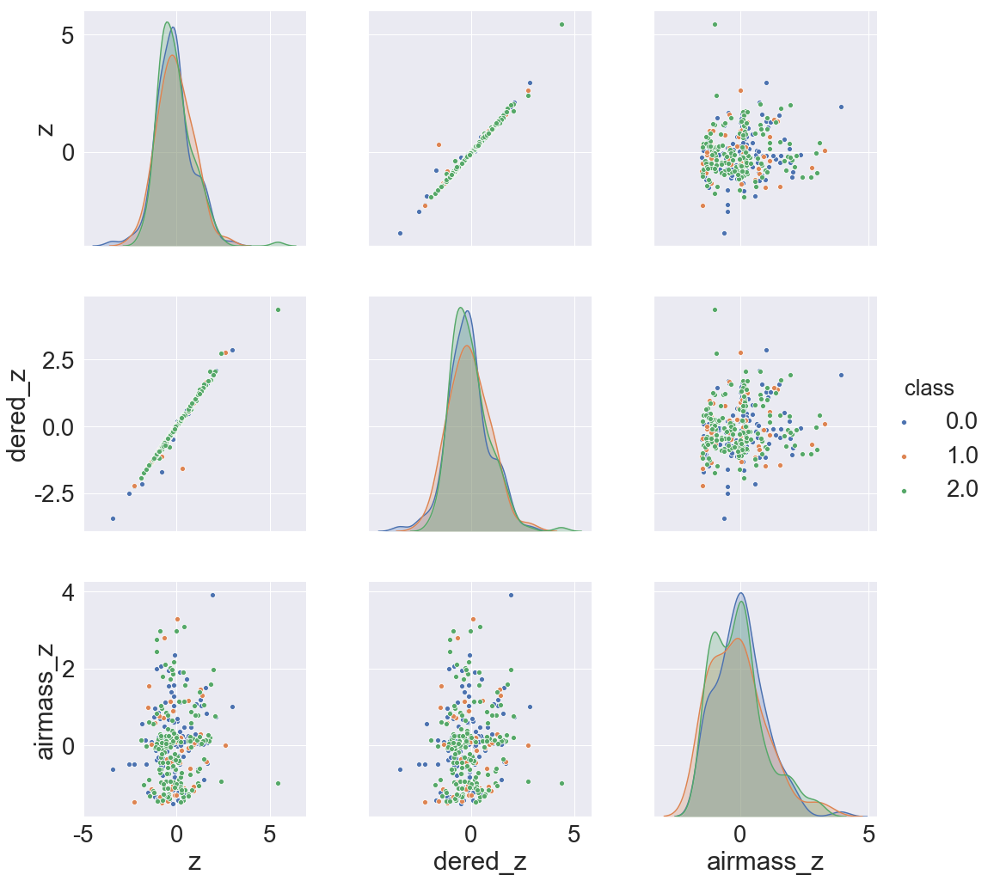

In [59]:
scaler = StandardScaler()
z_dered_airamss = scaler.fit_transform(train_sample[['z','dered_z','airmass_z']])
z_dered_airamss = pd.DataFrame(z_dered_airamss, columns = ['z','dered_z','airmass_z'])
z_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=z_dered_airamss, vars=['z','dered_z','airmass_z'],hue='class', size=5)

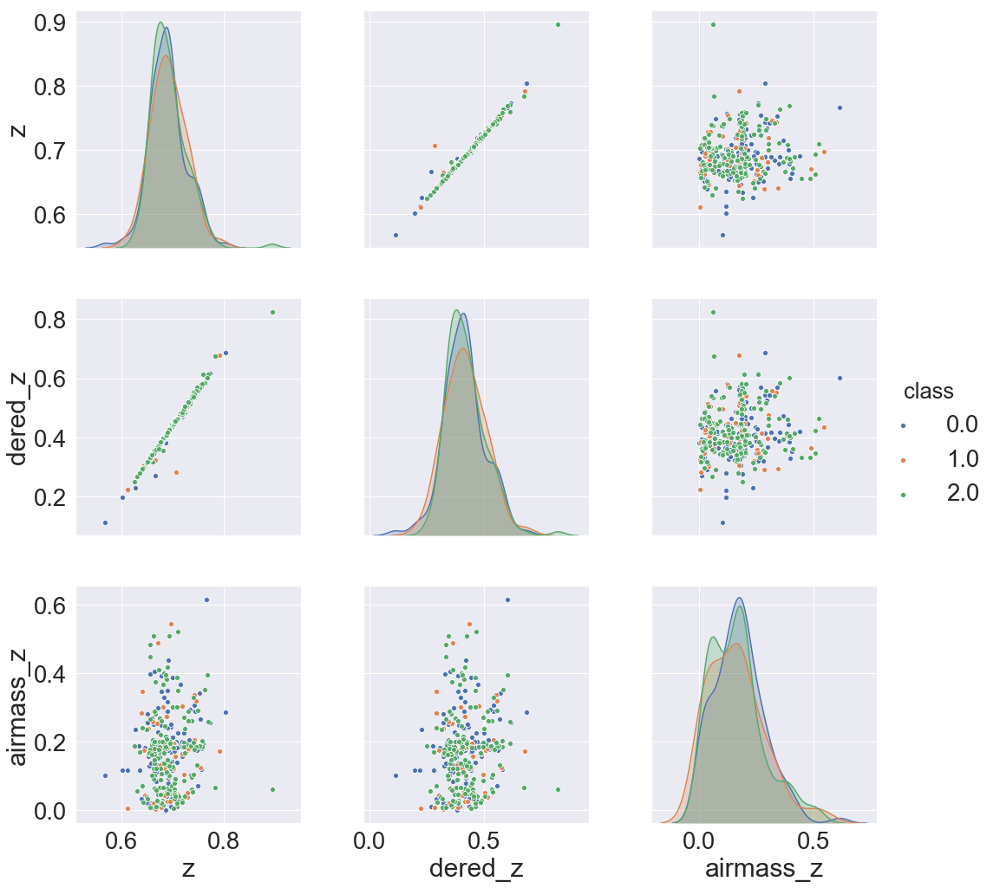

In [60]:
scaler = MinMaxScaler()
z_dered_airamss = scaler.fit_transform(train_sample[['z','dered_z','airmass_z']])
z_dered_airamss = pd.DataFrame(z_dered_airamss, columns = ['z','dered_z','airmass_z'])
z_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=z_dered_airamss, vars=['z','dered_z','airmass_z'],hue='class', size=5)

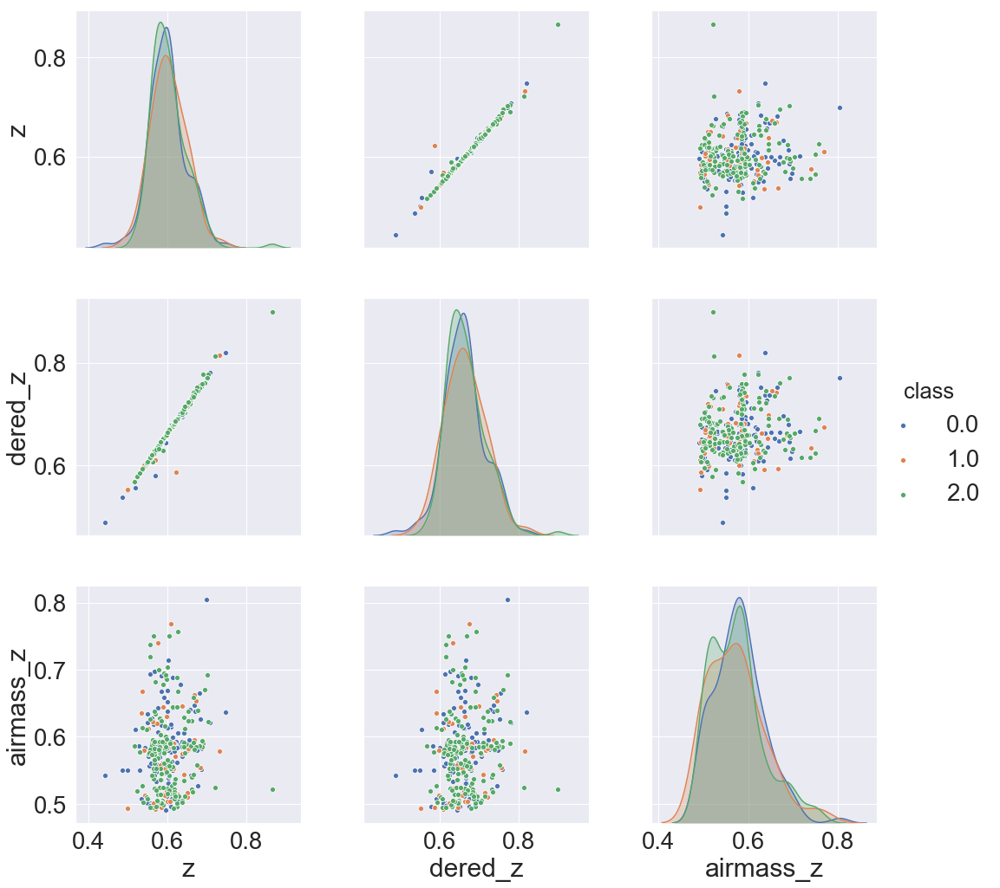

In [61]:
scaler = MaxAbsScaler()
z_dered_airamss = scaler.fit_transform(train_sample[['z','dered_z','airmass_z']])
z_dered_airamss = pd.DataFrame(z_dered_airamss, columns = ['z','dered_z','airmass_z'])
z_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=z_dered_airamss, vars=['z','dered_z','airmass_z'],hue='class', size=5)

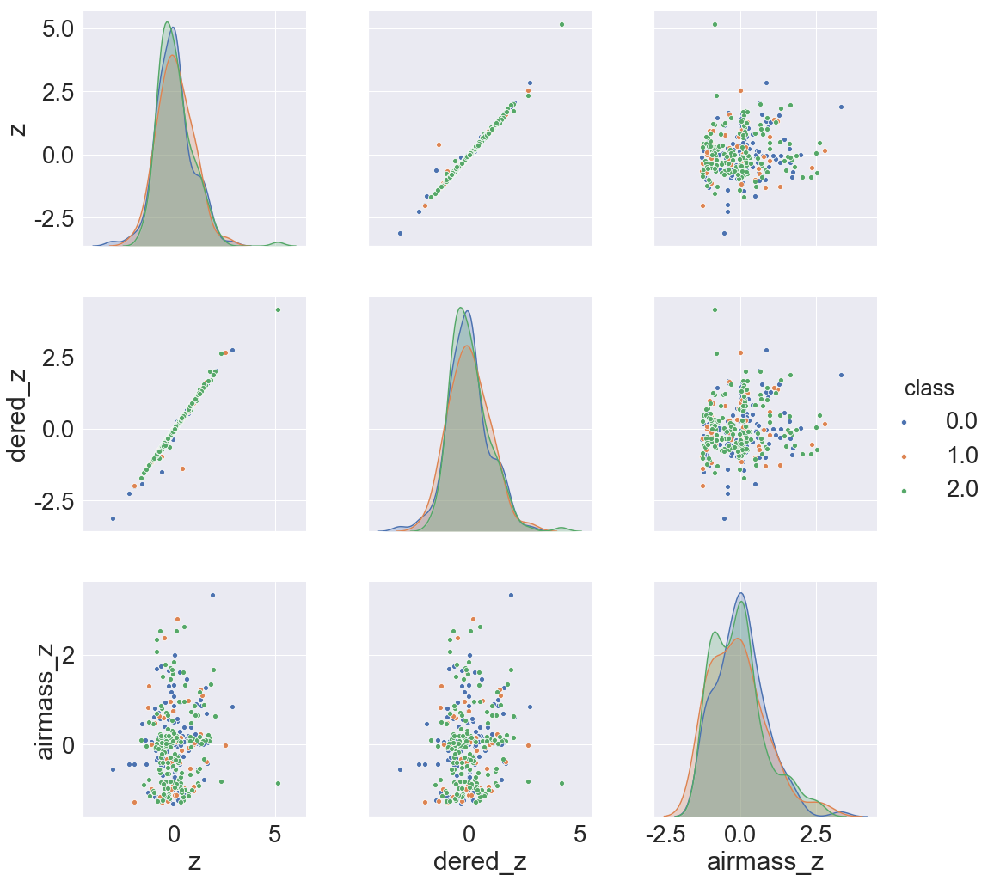

In [62]:
scaler = RobustScaler()
z_dered_airamss = scaler.fit_transform(train_sample[['z','dered_z','airmass_z']])
z_dered_airamss = pd.DataFrame(z_dered_airamss, columns = ['z','dered_z','airmass_z'])
z_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=z_dered_airamss, vars=['z','dered_z','airmass_z'],hue='class', size=5)

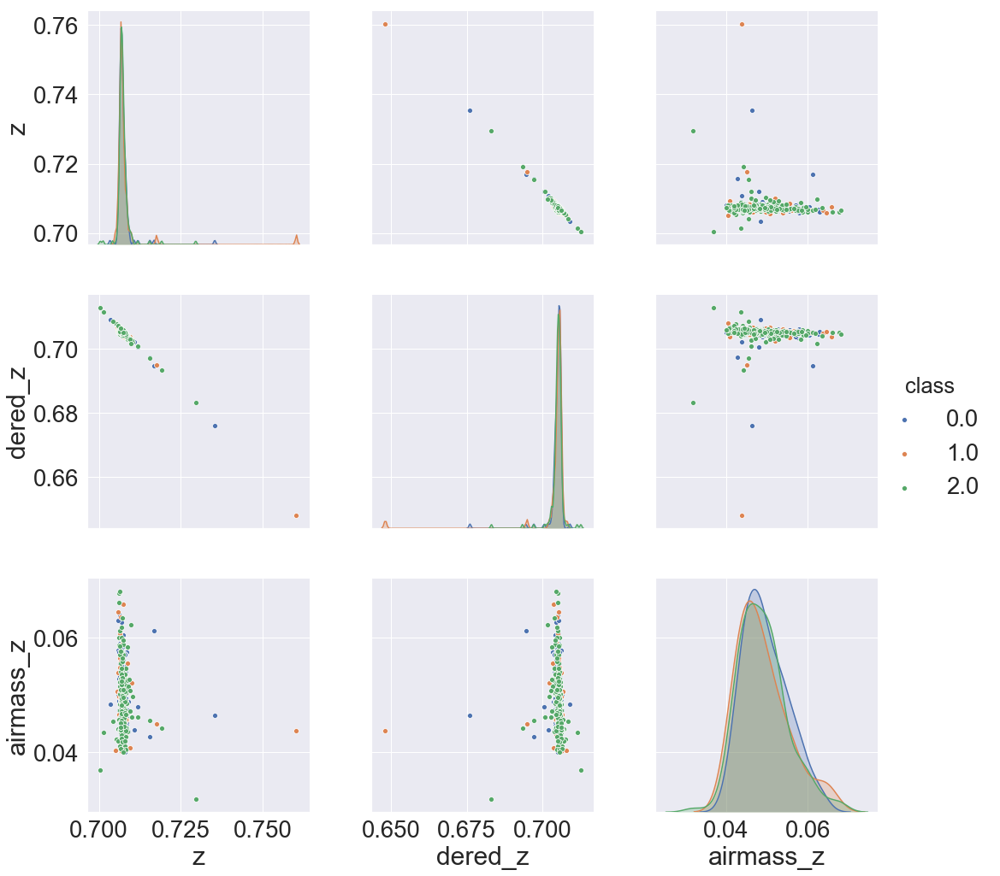

In [63]:
scaler = Normalizer()
z_dered_airamss = scaler.fit_transform(train_sample[['z','dered_z','airmass_z']])
z_dered_airamss = pd.DataFrame(z_dered_airamss, columns = ['z','dered_z','airmass_z'])
z_dered_airamss['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=z_dered_airamss, vars=['z','dered_z','airmass_z'],hue='class', size=5)

### redshift, nObserve, nDetect 에 대하여 스케일링

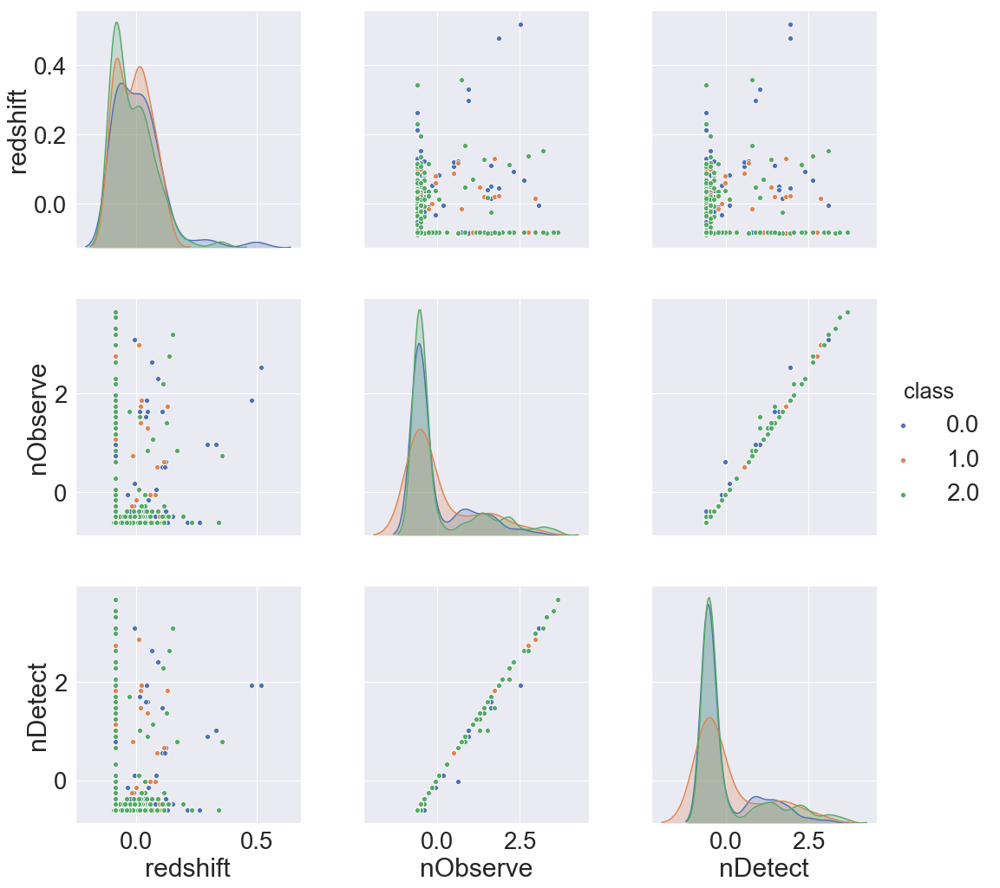

In [64]:
scaler = StandardScaler()
redshift_nObserve_nDetect = scaler.fit_transform(train_sample[['redshift','nObserve','nDetect']])
redshift_nObserve_nDetect = pd.DataFrame(redshift_nObserve_nDetect, columns = ['redshift','nObserve','nDetect'])
redshift_nObserve_nDetect['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=redshift_nObserve_nDetect, vars=['redshift','nObserve','nDetect'],hue='class', size=5)

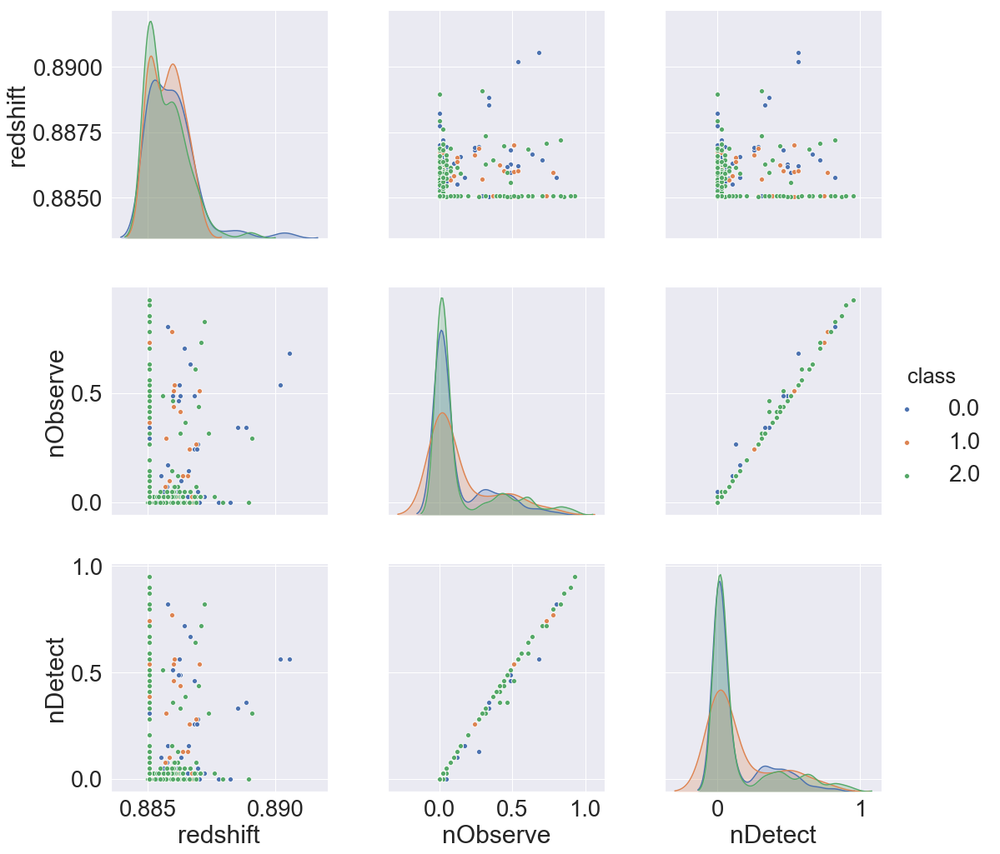

In [65]:
scaler = MinMaxScaler()
redshift_nObserve_nDetect = scaler.fit_transform(train_sample[['redshift','nObserve','nDetect']])
redshift_nObserve_nDetect = pd.DataFrame(redshift_nObserve_nDetect, columns = ['redshift','nObserve','nDetect'])
redshift_nObserve_nDetect['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=redshift_nObserve_nDetect, vars=['redshift','nObserve','nDetect'],hue='class', size=5)

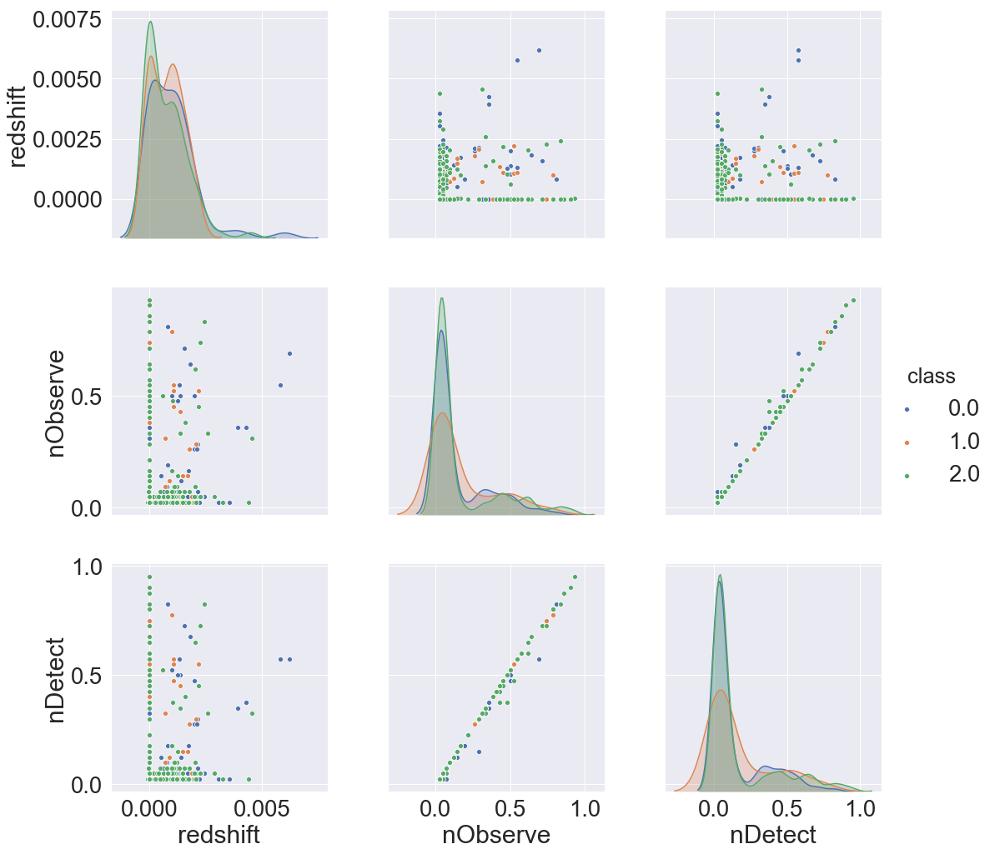

In [66]:
scaler = MaxAbsScaler()
redshift_nObserve_nDetect = scaler.fit_transform(train_sample[['redshift','nObserve','nDetect']])
redshift_nObserve_nDetect = pd.DataFrame(redshift_nObserve_nDetect, columns = ['redshift','nObserve','nDetect'])
redshift_nObserve_nDetect['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=redshift_nObserve_nDetect, vars=['redshift','nObserve','nDetect'],hue='class', size=5)

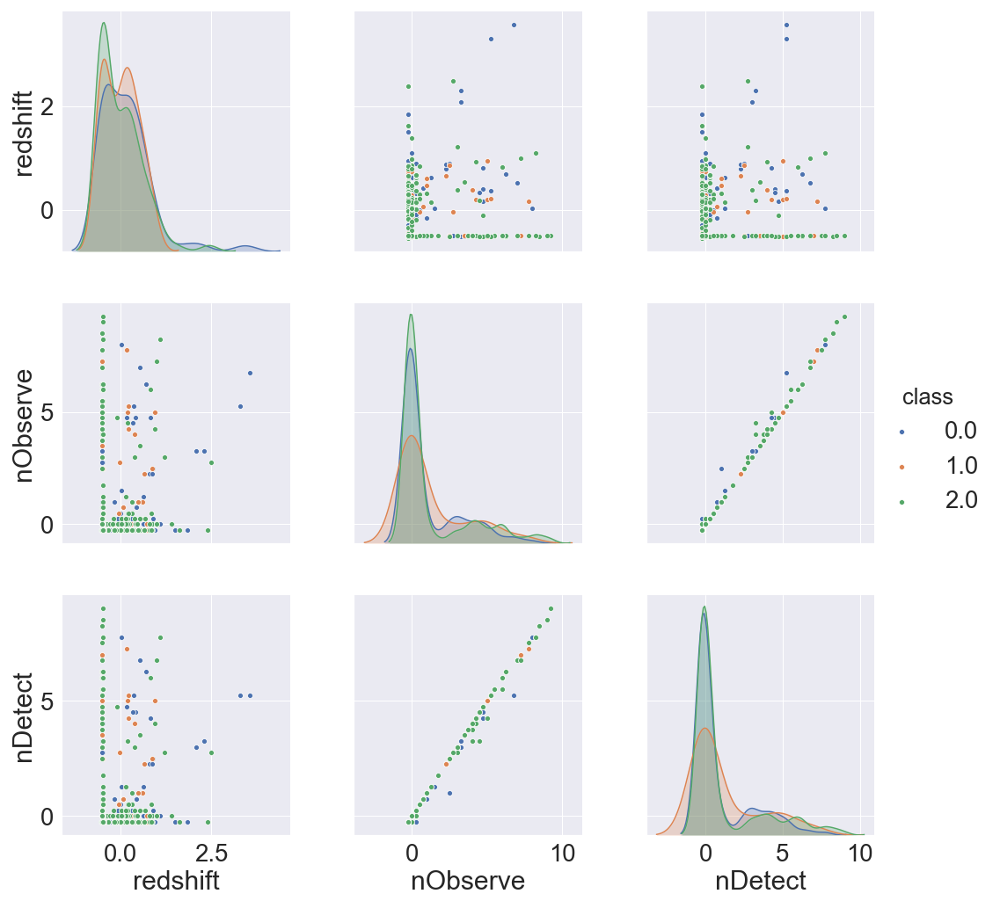

In [67]:
scaler = RobustScaler()
redshift_nObserve_nDetect = scaler.fit_transform(train_sample[['redshift','nObserve','nDetect']])
redshift_nObserve_nDetect = pd.DataFrame(redshift_nObserve_nDetect, columns = ['redshift','nObserve','nDetect'])
redshift_nObserve_nDetect['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=redshift_nObserve_nDetect, vars=['redshift','nObserve','nDetect'],hue='class', size=5)

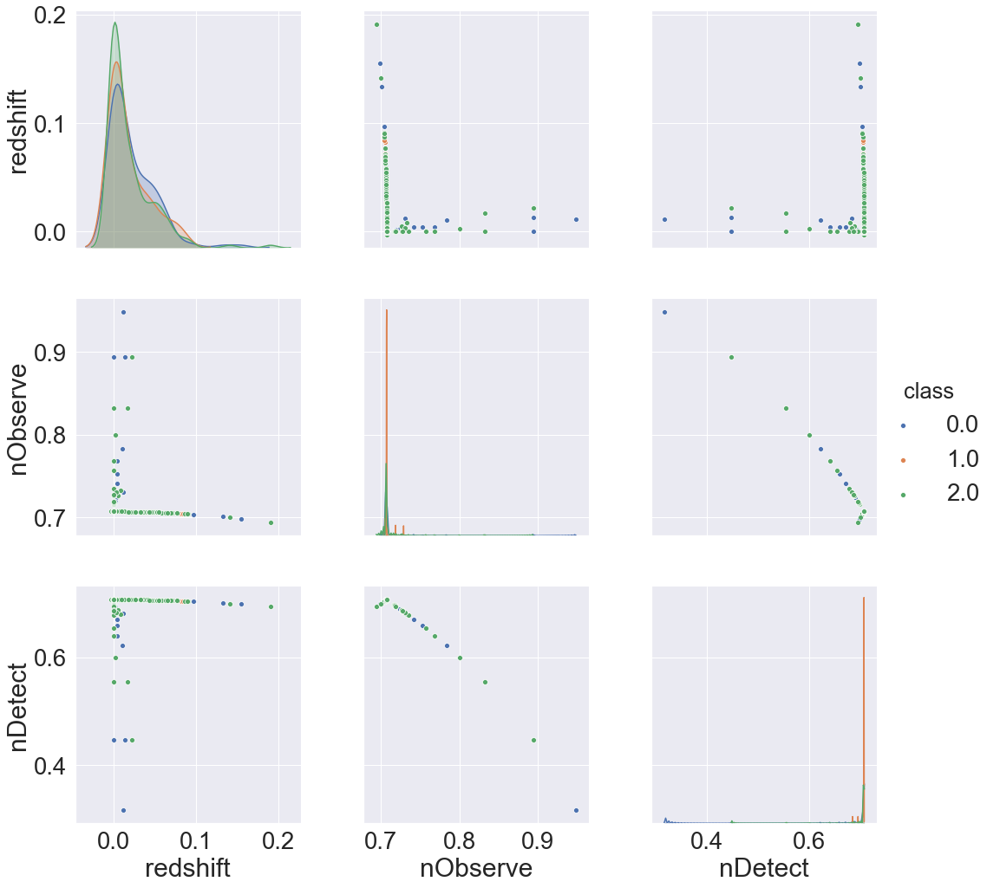

In [68]:
scaler = Normalizer()
redshift_nObserve_nDetect = scaler.fit_transform(train_sample[['redshift','nObserve','nDetect']])
redshift_nObserve_nDetect = pd.DataFrame(redshift_nObserve_nDetect, columns = ['redshift','nObserve','nDetect'])
redshift_nObserve_nDetect['class'] = pd.DataFrame.copy(train_sample['class'])
sns.pairplot(data=redshift_nObserve_nDetect, vars=['redshift','nObserve','nDetect'],hue='class', size=5)

## Binning

### X

#### u

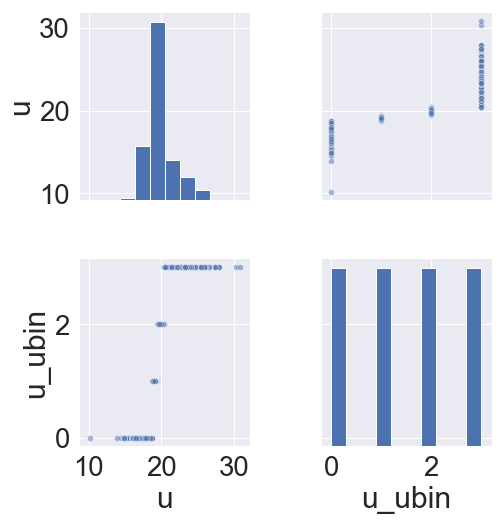

In [69]:
u_ubin = pd.DataFrame.copy(train_sample[['u','class']])
u_ubin['u_ubin'] = pd.qcut(train_sample['u'],4,labels=False)
sns.pairplot(data=u_ubin, vars=['u','u_ubin'], size=4,  plot_kws={'alpha': .5})

In [70]:
u_ubin.head()

,u,class,u_ubin
id,,,
40047,19.9919,2,2
240841,19.2634,2,1
89303,19.4655,2,2
293055,18.6142,0,0
140948,18.8011,1,1


In [71]:
u_ubin = pd.get_dummies(u_ubin,columns=['u_ubin'],prefix='u_ubin')
u_ubin.head()

,u,class,u_ubin_0,u_ubin_1,u_ubin_2,u_ubin_3
id,,,,,,
40047,19.9919,2,0,0,1,0
240841,19.2634,2,0,1,0,0
89303,19.4655,2,0,0,1,0
293055,18.6142,0,1,0,0,0
140948,18.8011,1,0,1,0,0


#### r

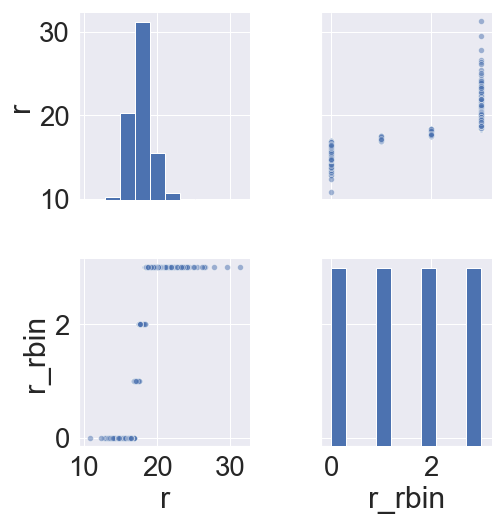

In [72]:
r_rbin = pd.DataFrame.copy(train_sample[['r','class']])
r_rbin['r_rbin'] = pd.qcut(train_sample['r'],4,labels=False)
sns.pairplot(data=r_rbin, vars=['r','r_rbin'], size=4,  plot_kws={'alpha': .5})

In [73]:
r_rbin.head()

,r,class,r_rbin
id,,,
40047,18.3839,2,2
240841,17.0643,2,1
89303,17.4701,2,1
293055,17.3541,0,1
140948,17.7282,1,2


In [74]:
r_rbin = pd.get_dummies(r_rbin, columns=['r_rbin'], prefix='r_rbin')
r_rbin.head()

,r,class,r_rbin_0,r_rbin_1,r_rbin_2,r_rbin_3
id,,,,,,
40047,18.3839,2,0,0,1,0
240841,17.0643,2,0,1,0,0
89303,17.4701,2,0,1,0,0
293055,17.3541,0,0,1,0,0
140948,17.7282,1,0,0,1,0


#### g

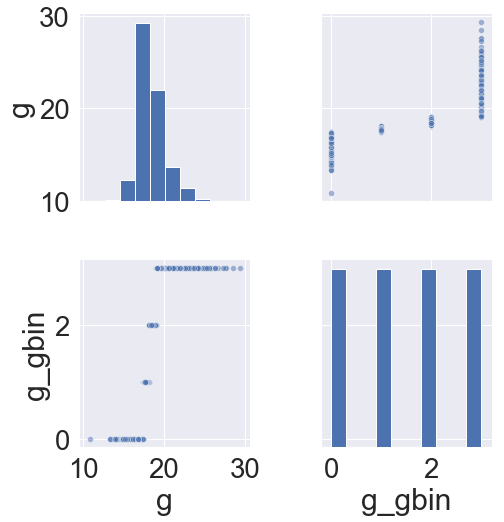

In [75]:
g_gbin = pd.DataFrame.copy(train_sample[['g','class']])
g_gbin['g_gbin'] = pd.qcut(train_sample['g'],4,labels=False)
sns.pairplot(data=g_gbin, vars=['g','g_gbin'], size=4,  plot_kws={'alpha': .5})

In [76]:
g_gbin.head()

,g,class,g_gbin
id,,,
40047,18.9708,2,2
240841,17.7903,2,1
89303,18.2111,2,2
293055,17.3839,0,0
140948,17.9585,1,1


In [77]:
g_gbin = pd.get_dummies(g_gbin, columns=['g_gbin'],prefix='g_gbin')
g_gbin.head()

,g,class,g_gbin_0,g_gbin_1,g_gbin_2,g_gbin_3
id,,,,,,
40047,18.9708,2,0,0,1,0
240841,17.7903,2,0,1,0,0
89303,18.2111,2,0,0,1,0
293055,17.3839,0,1,0,0,0
140948,17.9585,1,0,1,0,0


#### i

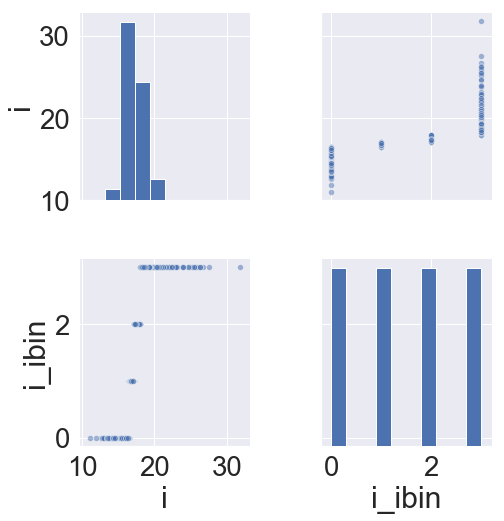

In [78]:
i_ibin = pd.DataFrame.copy(train_sample[['i','class']])
i_ibin['i_ibin'] = pd.qcut(train_sample['i'],4,labels=False)
sns.pairplot(data=i_ibin, vars=['i','i_ibin'], size=4,  plot_kws={'alpha': .5})

In [79]:
i_ibin.head()

,i,class,i_ibin
id,,,
40047,18.0328,2,3
240841,16.6247,2,1
89303,17.0306,2,1
293055,17.4033,0,2
140948,17.4856,1,2


In [80]:
i_ibin = pd.get_dummies(i_ibin, columns=['i_ibin'], prefix='i_ibin')
i_ibin.head()

,i,class,i_ibin_0,i_ibin_1,i_ibin_2,i_ibin_3
id,,,,,,
40047,18.0328,2,0,0,0,1
240841,16.6247,2,0,1,0,0
89303,17.0306,2,0,1,0,0
293055,17.4033,0,0,0,1,0
140948,17.4856,1,0,0,1,0


#### z

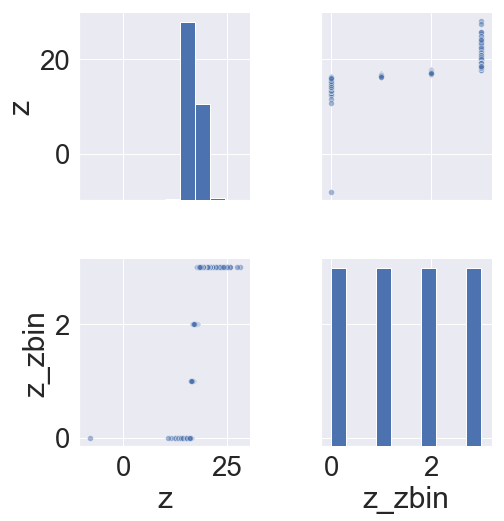

In [81]:
z_zbin = pd.DataFrame.copy(train_sample[['z','class']])
z_zbin['z_zbin'] = pd.qcut(train_sample['z'],4,labels=False)
sns.pairplot(data=z_zbin, vars=['z','z_zbin'], size=4,  plot_kws={'alpha': .5})

In [82]:
z_zbin.head()

,z,class,z_zbin
id,,,
40047,17.7959,2,3
240841,16.2894,2,1
89303,16.7544,2,1
293055,17.4311,0,2
140948,17.4884,1,2


In [83]:
z_zbin = pd.get_dummies(z_zbin, columns=['z_zbin'], prefix='z_zbin')
z_zbin.head()

,z,class,z_zbin_0,z_zbin_1,z_zbin_2,z_zbin_3
id,,,,,,
40047,17.7959,2,0,0,0,1
240841,16.2894,2,0,1,0,0
89303,16.7544,2,0,1,0,0
293055,17.4311,0,0,0,1,0
140948,17.4884,1,0,0,1,0


### dered_X

#### dered_u

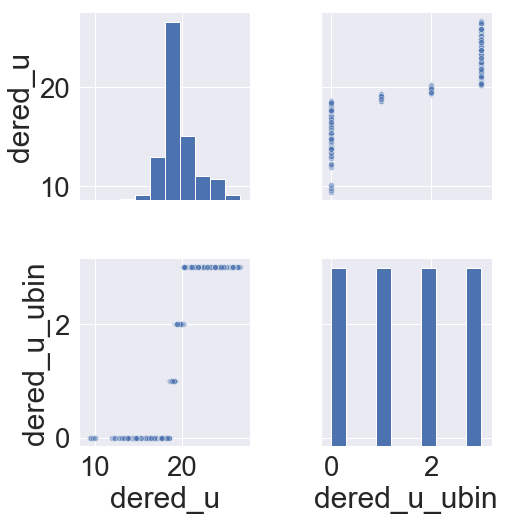

In [84]:
dered_u_ubin = pd.DataFrame.copy(train_sample[['dered_u','class']])
dered_u_ubin['dered_u_ubin'] = pd.qcut(train_sample['dered_u'],4,labels=False)
sns.pairplot(data=dered_u_ubin, vars=['dered_u','dered_u_ubin'], size=4,  plot_kws={'alpha': .5})

In [85]:
dered_u_ubin.head()

,dered_u,class,dered_u_ubin
id,,,
40047,19.7148,2,2
240841,19.2405,2,1
89303,19.3278,2,2
293055,18.5441,0,0
140948,18.6984,1,1


In [86]:
dered_u_ubin = pd.get_dummies(dered_u_ubin, columns=['dered_u_ubin'], prefix='dered_u_ubin')
dered_u_ubin.head()

,dered_u,class,dered_u_ubin_0,dered_u_ubin_1,dered_u_ubin_2,dered_u_ubin_3
id,,,,,,
40047,19.7148,2,0,0,1,0
240841,19.2405,2,0,1,0,0
89303,19.3278,2,0,0,1,0
293055,18.5441,0,1,0,0,0
140948,18.6984,1,0,1,0,0


#### dered_r

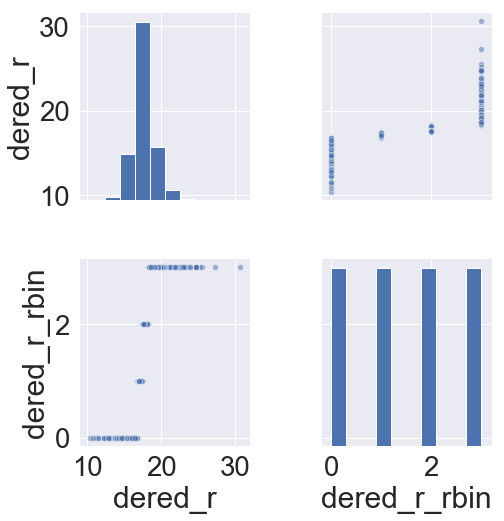

In [87]:
dered_r_rbin = pd.DataFrame.copy(train_sample[['dered_r','class']])
dered_r_rbin['dered_r_rbin'] = pd.qcut(train_sample['dered_r'],4,labels=False)
sns.pairplot(data=dered_r_rbin, vars=['dered_r','dered_r_rbin'], size=4,  plot_kws={'alpha': .5})

In [88]:
dered_r_rbin.head()

,dered_r,class,dered_r_rbin
id,,,
40047,18.2146,2,2
240841,17.0372,2,1
89303,17.4011,2,1
293055,17.3151,0,1
140948,17.6612,1,2


In [89]:
dered_r_rbin = pd.get_dummies(dered_r_rbin, columns=['dered_r_rbin'], prefix='dered_r_rbin')
dered_r_rbin.head()

,dered_r,class,dered_r_rbin_0,dered_r_rbin_1,dered_r_rbin_2,dered_r_rbin_3
id,,,,,,
40047,18.2146,2,0,0,1,0
240841,17.0372,2,0,1,0,0
89303,17.4011,2,0,1,0,0
293055,17.3151,0,0,1,0,0
140948,17.6612,1,0,0,1,0


#### dered_g

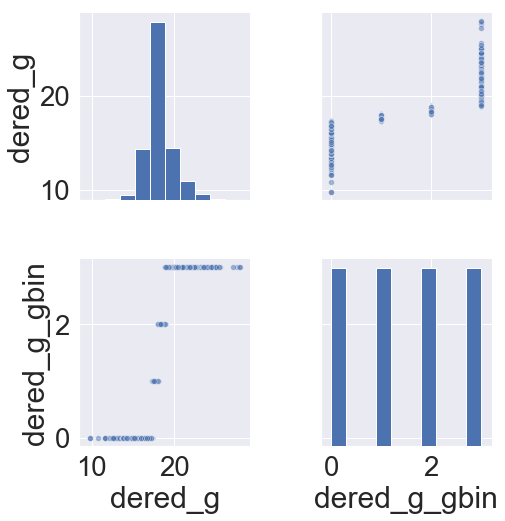

In [90]:
dered_g_gbin = pd.DataFrame.copy(train_sample[['dered_g','class']])
dered_g_gbin['dered_g_gbin'] = pd.qcut(train_sample['dered_g'],4,labels=False)
sns.pairplot(data=dered_g_gbin, vars=['dered_g','dered_g_gbin'], size=4,  plot_kws={'alpha': .5})

In [91]:
dered_g_gbin.head()

,dered_g,class,dered_g_gbin
id,,,
40047,18.7205,2,2
240841,17.7504,2,1
89303,18.1116,2,2
293055,17.3261,0,0
140948,17.8546,1,1


In [92]:
dered_g_gbin = pd.get_dummies(dered_g_gbin, columns=['dered_g_gbin'], prefix='dered_g_gbin')
dered_g_gbin.head()

,dered_g,class,dered_g_gbin_0,dered_g_gbin_1,dered_g_gbin_2,dered_g_gbin_3
id,,,,,,
40047,18.7205,2,0,0,1,0
240841,17.7504,2,0,1,0,0
89303,18.1116,2,0,0,1,0
293055,17.3261,0,1,0,0,0
140948,17.8546,1,0,1,0,0


#### dered_i

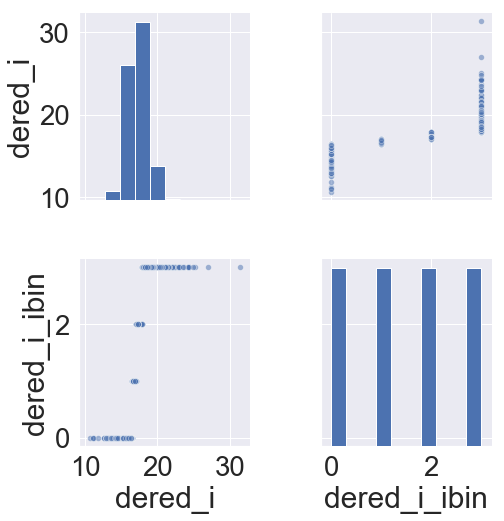

In [93]:
dered_i_ibin = pd.DataFrame.copy(train_sample[['dered_i','class']])
dered_i_ibin['dered_i_ibin'] = pd.qcut(train_sample['dered_i'],4,labels=False)
sns.pairplot(data=dered_i_ibin, vars=['dered_i','dered_i_ibin'], size=4,  plot_kws={'alpha': .5})

In [94]:
dered_i_ibin.head()

,dered_i,class,dered_i_ibin
id,,,
40047,17.9112,2,3
240841,16.6054,2,1
89303,16.9788,2,1
293055,17.3752,0,2
140948,17.4415,1,2


In [95]:
dered_i_ibin = pd.get_dummies(dered_i_ibin, columns=['dered_i_ibin'], prefix='dered_i_ibin')
dered_i_ibin.head()

,dered_i,class,dered_i_ibin_0,dered_i_ibin_1,dered_i_ibin_2,dered_i_ibin_3
id,,,,,,
40047,17.9112,2,0,0,0,1
240841,16.6054,2,0,1,0,0
89303,16.9788,2,0,1,0,0
293055,17.3752,0,0,0,1,0
140948,17.4415,1,0,0,1,0


#### dered_z

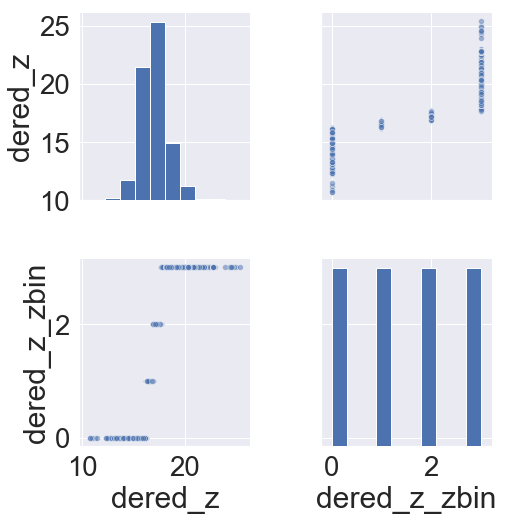

In [96]:
dered_z_zbin = pd.DataFrame.copy(train_sample[['dered_z','class']])
dered_z_zbin['dered_z_zbin'] = pd.qcut(train_sample['dered_z'],4,labels=False)
sns.pairplot(data=dered_z_zbin, vars=['dered_z','dered_z_zbin'], size=4,  plot_kws={'alpha': .5})

In [97]:
dered_z_zbin.head()

,dered_z,class,dered_z_zbin
id,,,
40047,17.7365,2,3
240841,16.2806,2,1
89303,16.7127,2,1
293055,17.4139,0,2
140948,17.4933,1,2


In [98]:
dered_z_zbin = pd.get_dummies(dered_z_zbin, columns=['dered_z_zbin'], prefix='dered_z_zbin')
dered_z_zbin.head()

,dered_z,class,dered_z_zbin_0,dered_z_zbin_1,dered_z_zbin_2,dered_z_zbin_3
id,,,,,,
40047,17.7365,2,0,0,0,1
240841,16.2806,2,0,1,0,0
89303,16.7127,2,0,1,0,0
293055,17.4139,0,0,0,1,0
140948,17.4933,1,0,0,1,0


### airmass_X

#### airmass_u

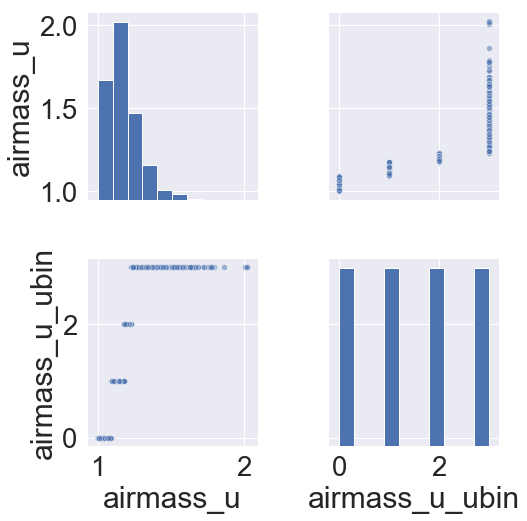

In [99]:
airmass_u_ubin = pd.DataFrame.copy(train_sample[['airmass_u','class']])
airmass_u_ubin['airmass_u_ubin'] = pd.qcut(train_sample['airmass_u'],4,labels=False)
sns.pairplot(data=airmass_u_ubin, vars=['airmass_u','airmass_u_ubin'], size=4,  plot_kws={'alpha': .5})

In [100]:
airmass_u_ubin.head()

,airmass_u,class,airmass_u_ubin
id,,,
40047,1.1985,2,2
240841,1.1083,2,1
89303,1.1886,2,2
293055,1.0172,0,0
140948,1.0902,1,0


In [101]:
airmass_u_ubin = pd.get_dummies(airmass_u_ubin, columns=['airmass_u_ubin'], prefix='airmass_u_ubin')
airmass_u_ubin.head()

,airmass_u,class,airmass_u_ubin_0,airmass_u_ubin_1,airmass_u_ubin_2,airmass_u_ubin_3
id,,,,,,
40047,1.1985,2,0,0,1,0
240841,1.1083,2,0,1,0,0
89303,1.1886,2,0,0,1,0
293055,1.0172,0,1,0,0,0
140948,1.0902,1,1,0,0,0


#### airmass_r

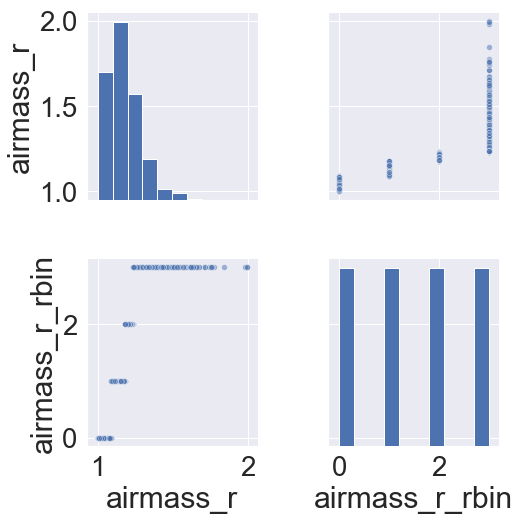

In [102]:
airmass_r_rbin = pd.DataFrame.copy(train_sample[['airmass_r','class']])
airmass_r_rbin['airmass_r_rbin'] = pd.qcut(train_sample['airmass_r'],4,labels=False)
sns.pairplot(data=airmass_r_rbin, vars=['airmass_r','airmass_r_rbin'], size=4,  plot_kws={'alpha': .5})

In [103]:
airmass_r_rbin.head()

,airmass_r,class,airmass_r_rbin
id,,,
40047,1.1982,2,2
240841,1.1038,2,1
89303,1.1820,2,2
293055,1.0184,0,0
140948,1.0875,1,0


In [104]:
airmass_r_rbin = pd.get_dummies(airmass_r_rbin, columns=['airmass_r_rbin'], prefix='airmass_r_rbin')
airmass_r_rbin.head()

,airmass_r,class,airmass_r_rbin_0,airmass_r_rbin_1,airmass_r_rbin_2,airmass_r_rbin_3
id,,,,,,
40047,1.1982,2,0,0,1,0
240841,1.1038,2,0,1,0,0
89303,1.1820,2,0,0,1,0
293055,1.0184,0,1,0,0,0
140948,1.0875,1,1,0,0,0


#### airmass_g

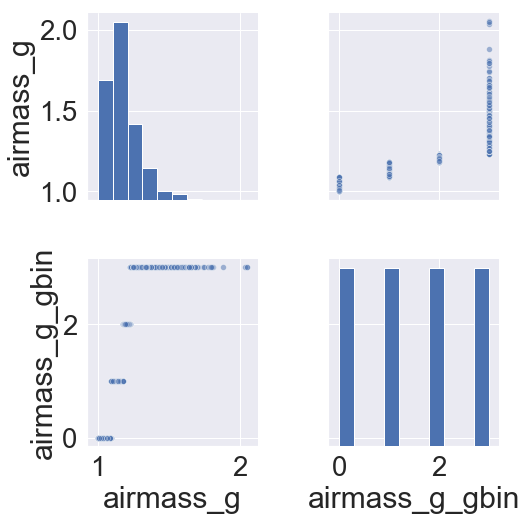

In [105]:
airmass_g_gbin = pd.DataFrame.copy(train_sample[['airmass_g','class']])
airmass_g_gbin['airmass_g_gbin'] = pd.qcut(train_sample['airmass_g'],4,labels=False)
sns.pairplot(data=airmass_g_gbin, vars=['airmass_g','airmass_g_gbin'], size=4,  plot_kws={'alpha': .5})

In [106]:
airmass_g_gbin.head()

,airmass_g,class,airmass_g_gbin
id,,,
40047,1.1990,2,2
240841,1.1129,2,1
89303,1.1954,2,2
293055,1.0162,0,0
140948,1.0930,1,1


#### airmass_i

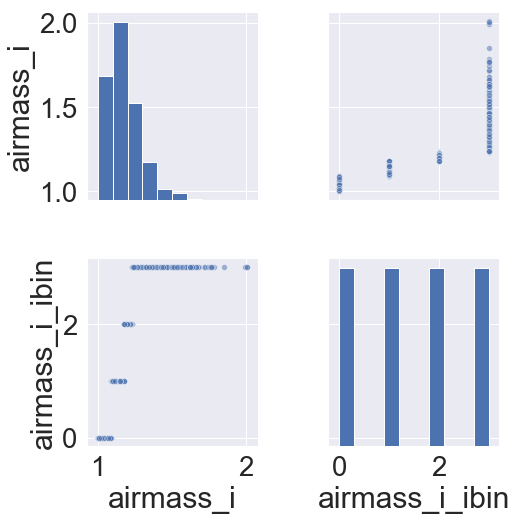

In [107]:
airmass_i_ibin = pd.DataFrame.copy(train_sample[['airmass_i','class']])
airmass_i_ibin['airmass_i_ibin'] = pd.qcut(train_sample['airmass_i'],4,labels=False)
sns.pairplot(data=airmass_i_ibin, vars=['airmass_i','airmass_i_ibin'], size=4,  plot_kws={'alpha': .5})

In [108]:
airmass_i_ibin.head()

,airmass_i,class,airmass_i_ibin
id,,,
40047,1.1983,2,2
240841,1.1060,2,1
89303,1.1852,2,2
293055,1.0178,0,0
140948,1.0889,1,0


In [109]:
airmass_i_ibin = pd.get_dummies(airmass_i_ibin, columns=['airmass_i_ibin'], prefix='airmass_i_ibin')
airmass_i_ibin.head()

,airmass_i,class,airmass_i_ibin_0,airmass_i_ibin_1,airmass_i_ibin_2,airmass_i_ibin_3
id,,,,,,
40047,1.1983,2,0,0,1,0
240841,1.1060,2,0,1,0,0
89303,1.1852,2,0,0,1,0
293055,1.0178,0,1,0,0,0
140948,1.0889,1,1,0,0,0


#### airmass_z

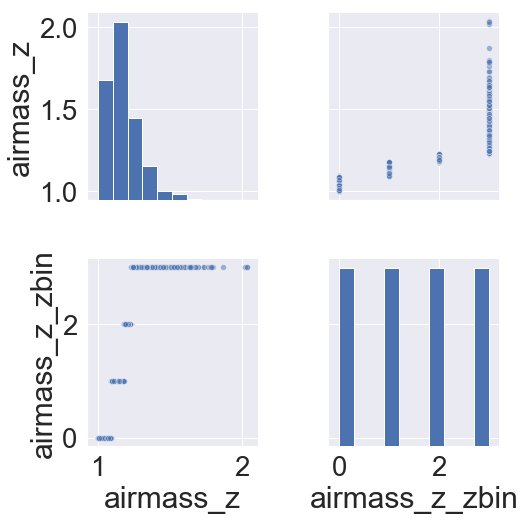

In [110]:
airmass_z_zbin = pd.DataFrame.copy(train_sample[['airmass_z','class']])
airmass_z_zbin['airmass_z_zbin'] = pd.qcut(train_sample['airmass_z'],4,labels=False)
sns.pairplot(data=airmass_z_zbin, vars=['airmass_z','airmass_z_zbin'], size=4,  plot_kws={'alpha': .5})

In [111]:
airmass_z_zbin.head()

,airmass_z,class,airmass_z_zbin
id,,,
40047,1.1987,2,2
240841,1.1106,2,1
89303,1.1919,2,2
293055,1.0167,0,0
140948,1.0916,1,1


In [112]:
airmass_z_zbin = pd.get_dummies(airmass_z_zbin, columns=['airmass_z_zbin'], prefix='airmass_z_zbin')
airmass_z_zbin.head()

,airmass_z,class,airmass_z_zbin_0,airmass_z_zbin_1,airmass_z_zbin_2,airmass_z_zbin_3
id,,,,,,
40047,1.1987,2,0,0,1,0
240841,1.1106,2,0,1,0,0
89303,1.1919,2,0,0,1,0
293055,1.0167,0,1,0,0,0
140948,1.0916,1,0,1,0,0


### redshifit

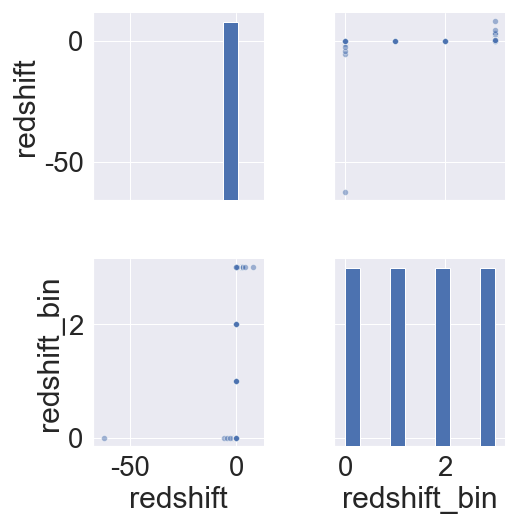

In [113]:
redshift_bin = pd.DataFrame.copy(train_sample[['redshift','class']])
redshift_bin['redshift_bin'] = pd.qcut(train_sample['redshift'],4,labels=False)
sns.pairplot(data=redshift_bin, vars=['redshift','redshift_bin'], size=4,  plot_kws={'alpha': .5})

In [114]:
redshift_bin.head()

,redshift,class,redshift_bin
id,,,
40047,0.0857,2,2
240841,0.0584,2,2
89303,0.1239,2,3
293055,-0.0002,0,0
140948,0.1103,1,3


In [115]:
redshift_bin = pd.get_dummies(redshift_bin, columns=['redshift_bin'], prefix='redshift_bin')
redshift_bin.head()

,redshift,class,redshift_bin_0,redshift_bin_1,redshift_bin_2,redshift_bin_3
id,,,,,,
40047,0.0857,2,0,0,1,0
240841,0.0584,2,0,0,1,0
89303,0.1239,2,0,0,0,1
293055,-0.0002,0,1,0,0,0
140948,0.1103,1,0,0,0,1


## 다항회귀

In [116]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)

In [117]:
X = poly.fit_transform(train_sample.iloc[:,:18])
X.shape

(10000, 190)